# Figures & Tables

In [ ]:
import os
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import iris
from iris import plot
import xarray as xr
import cf_units
import cftime
import cartopy
import cartopy.crs as ccrs
import geopandas as gpd
import warnings
import pandas as pd
import dask.dataframe as dd
from dask.diagnostics import ProgressBar
import pickle
from copy import deepcopy
from scipy import stats
from scipy.signal import periodogram
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import tqdm
import random
from Functions import *
from Global_Variables import *
from pprint import pprint
tqdm.tqdm.pandas(desc='Progress bar')

In [49]:
obs_df = pd.read_pickle(os.path.join(RESULTS_PATH, 'AR6_obs_df.pkl'))
obsclim_df = pd.read_pickle(os.path.join(RESULTS_PATH, 'AR6_obsclim_df.pkl'))
counterclim_df = pd.read_pickle(os.path.join(RESULTS_PATH, 'AR6_counterclim_df.pkl'))
model_weights = pd.read_pickle(os.path.join(RESULTS_PATH, 'optimal_weights.pkl'))

#RMSE_RA = pd.read_pickle(os.path.join(RESULTS_PATH, 'RMSE_RA_monthly.pkl')).astype(np.float32)
RMSE_yearly_RA = pd.read_pickle(os.path.join(RESULTS_PATH, 'RMSE_RA_annual.pkl')).astype(np.float32)
RMSE_monthly_RA = pd.read_pickle(os.path.join(RESULTS_PATH, 'RMSE_monthly_RA_monthly.pkl')).astype(np.float32)

RMSE_monthly_log_RA_monthly_df = pd.read_pickle(os.path.join(RESULTS_PATH, 'RMSE_monthly_log_RA_monthly.pkl')).astype(np.float32)
RMSE_RA = RMSE_monthly_log_RA_monthly_df

INPUT_PATH = os.path.join(DATA_PATH, 'ISIMIP', 'ISIMIP3a', 'InputData', '')

In [3]:
pd_start_year, pd_end_year = 2003, 2019
ei_start_year, ei_end_year = 1901, 1917
num_resamples=int(1e4)

regions = sorted(list(obs_df.columns.levels[0]))
custom_order_idx = ['Global'] + regions

quantiles_result = [0.025, 0.5, 0.975]

In [5]:
color_dict = dict(list(zip(['blue', 'orange', 'green', 'purple', 'brown'], sns.color_palette("deep")[:3] + [sns.color_palette("deep")[4]] + [sns.color_palette("deep")[5]])))

mpl.colormaps.register(mcolors.LinearSegmentedColormap.from_list('cmap_1a', [color_dict['blue'], color_dict['orange']], N=2))
mpl.colormaps.register(mcolors.LinearSegmentedColormap.from_list('cmap_1c', [color_dict['brown'], color_dict['purple']], N=2))
mpl.colormaps.register(mcolors.LinearSegmentedColormap.from_list('cmap_1e', [color_dict['brown'], color_dict['green']], N=2))

## Figures

### Main Figures

#### Figure 1

##### Generate the underlying data

##### CC

In [6]:
obsclim_with_global = add_global(obsclim_df)
counterclim_with_global = add_global(counterclim_df)

obsclim_pd = constrain_time(obsclim_with_global, pd_start_year, pd_end_year)
counterclim_pd = constrain_time(counterclim_with_global, pd_start_year, pd_end_year)

In [7]:
obsclim_pd_ra_counterclim_pd = relative_anomaly(obsclim_pd, counterclim_pd).replace([np.inf, -np.inf], np.nan)
counterclim_pd_ra = relative_anomaly(counterclim_pd).replace([np.inf, -np.inf], np.nan)

In [8]:
index=pd.MultiIndex.from_product([model_weights.index, *obsclim_df.columns.levels])

obsclim_pd_ra_counterclim_pd_plus_error = pd.Series(np.nan, index=index).groupby('idx').progress_apply(lambda idx_df: add_error(obsclim_pd_ra_counterclim_pd, seed=idx_df.name, error=RMSE_RA))
counterclim_pd_ra_plus_error = pd.Series(np.nan, index=index).groupby('idx').progress_apply(lambda idx_df: add_error(counterclim_pd_ra, seed=idx_df.name, error=RMSE_RA))

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 202.08it/s]


In [9]:
obsclim_pd_ra_counterclim_pd_plus_error_plus_weights = pd.DataFrame(obsclim_pd_ra_counterclim_pd_plus_error.stack(['Region', 'Model'])).rename(columns={0: 'RA'}).merge(model_weights.stack(['Region', 'Model']).reset_index().rename(columns={0: 'weights'}), on=['idx', 'Region', 'Model']).drop('Model', axis=1)
counterclim_pd_ra_plus_error_plus_weights = pd.DataFrame(counterclim_pd_ra_plus_error.stack(['Region', 'Model'])).rename(columns={0: 'RA'}).merge(model_weights.stack(['Region', 'Model']).reset_index().rename(columns={0: 'weights'}), on=['idx', 'Region', 'Model']).drop('Model', axis=1)

In [10]:
counterclim_pd_ra_results = counterclim_pd_ra_plus_error_plus_weights.groupby(['idx', 'Region'], observed=True).progress_apply(lambda df: get_results(df, num_resamples=num_resamples))
obsclim_pd_ra_counterclim_pd_results = obsclim_pd_ra_counterclim_pd_plus_error_plus_weights.groupby(['idx', 'Region'], observed=True).progress_apply(lambda df: get_results(df, num_resamples=num_resamples, other_mean=counterclim_pd_ra_results.loc[df.name, 'mean']))

Progress bar: 100%|█████████████████████████████████████████████████████████████| 44000/44000 [04:25<00:00, 166.03it/s]


In [11]:
lsuffix, rsuffix = 'obsclim', 'counterclim'
obsclim_pd_ra_counterclim_pd_results_joined = obsclim_pd_ra_counterclim_pd_results.join(on=['idx', 'Region'], other=counterclim_pd_ra_results, lsuffix=lsuffix, rsuffix=rsuffix)

var = '0.5'
obsclim_pd_ra_counterclim_pd_results_final = (obsclim_pd_ra_counterclim_pd_results_joined[f'{var}{lsuffix}']-obsclim_pd_ra_counterclim_pd_results_joined[f'{var}{rsuffix}']).unstack('Region').quantile(q=quantiles_result).T*100

PDFs Fig. 1a

In [12]:
obsclim_pd_ra_counterclim_pd_plus_error_plus_weights_global = obsclim_pd_ra_counterclim_pd_plus_error_plus_weights.loc[obsclim_pd_ra_counterclim_pd_plus_error_plus_weights.Region == 'Global'].drop(columns='Region')
counterclim_pd_ra_plus_error_plus_weights_global = counterclim_pd_ra_plus_error_plus_weights.loc[counterclim_pd_ra_plus_error_plus_weights.Region == 'Global'].drop(columns='Region')

In [13]:
obsclim_pd_ra_counterclim_pd_plus_error_plus_weights_global_resampled = obsclim_pd_ra_counterclim_pd_plus_error_plus_weights_global.groupby(['idx']).progress_apply(lambda df: df.sample(n=num_resamples, replace=True, weights='weights', random_state=create_rng(SEED))['RA']).reset_index()['RA']
counterclim_pd_ra_plus_error_plus_weights_global_resampled = counterclim_pd_ra_plus_error_plus_weights_global.groupby(['idx']).progress_apply(lambda df: df.sample(n=num_resamples, replace=True, weights='weights', random_state=create_rng(SEED))['RA']).reset_index()['RA']

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 290.64it/s]


##### DHF

In [14]:
counterclim_ei = add_global(constrain_time(counterclim_df, ei_start_year, ei_end_year))

counterclim_pd_ra_counterclim_ei = relative_anomaly(counterclim_pd, counterclim_ei).replace([np.inf, -np.inf], np.nan)
counterclim_ei_ra = relative_anomaly(counterclim_ei).replace([np.inf, -np.inf], np.nan)

In [15]:
counterclim_pd_ra_counterclim_ei_plus_error = pd.Series(np.nan, index=index).groupby('idx').progress_apply(lambda idx_df: add_error(counterclim_pd_ra_counterclim_ei, seed=idx_df.name, error=RMSE_RA))
counterclim_ei_ra_plus_error = pd.Series(np.nan, index=index).groupby('idx').progress_apply(lambda idx_df: add_error(counterclim_ei_ra, seed=idx_df.name, error=RMSE_RA))

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:07<00:00, 128.06it/s]


In [16]:
counterclim_pd_ra_counterclim_ei_plus_error_plus_weights = pd.DataFrame(counterclim_pd_ra_counterclim_ei_plus_error.stack(['Region', 'Model'])).rename(columns={0: 'RA'}).merge(model_weights.stack(['Region', 'Model']).reset_index().rename(columns={0: 'weights'}), on=['idx', 'Region', 'Model']).drop('Model', axis=1)
counterclim_ei_ra_plus_error_plus_weights = pd.DataFrame(counterclim_ei_ra_plus_error.stack(['Region', 'Model'])).rename(columns={0: 'RA'}).merge(model_weights.stack(['Region', 'Model']).reset_index().rename(columns={0: 'weights'}), on=['idx', 'Region', 'Model']).drop('Model', axis=1)

In [17]:
counterclim_ei_ra_results = counterclim_ei_ra_plus_error_plus_weights.groupby(['idx', 'Region'], observed=True).progress_apply(lambda df: get_results(df, num_resamples=num_resamples))
counterclim_pd_ra_counterclim_ei_results = counterclim_pd_ra_counterclim_ei_plus_error_plus_weights.groupby(['idx', 'Region'], observed=True).progress_apply(lambda df: get_results(df, num_resamples=num_resamples, other_mean=counterclim_ei_ra_results.loc[df.name, 'mean']))

Progress bar: 100%|█████████████████████████████████████████████████████████████| 44000/44000 [03:43<00:00, 197.08it/s]


In [18]:
lsuffix, rsuffix = 'PD', 'EI'
var = '0.5'

counterclim_pd_ra_counterclim_ei_results_joined = counterclim_pd_ra_counterclim_ei_results.join(on=['idx', 'Region'], other=counterclim_ei_ra_results, lsuffix=lsuffix, rsuffix=rsuffix)
counterclim_pd_ra_counterclim_ei_results_final = (counterclim_pd_ra_counterclim_ei_results_joined[f'{var}{lsuffix}']-counterclim_pd_ra_counterclim_ei_results_joined[f'{var}{rsuffix}']).unstack('Region').quantile(q=quantiles_result).T*100

PDFs Fig. 1c

In [19]:
counterclim_pd_ra_counterclim_ei_plus_error_plus_weights_global = counterclim_pd_ra_counterclim_ei_plus_error_plus_weights.loc[counterclim_pd_ra_counterclim_ei_plus_error_plus_weights.Region == 'Global']
counterclim_ei_ra_plus_error_plus_weights_global = counterclim_ei_ra_plus_error_plus_weights.loc[counterclim_ei_ra_plus_error_plus_weights.Region == 'Global']

In [20]:
counterclim_pd_ra_counterclim_ei_plus_error_plus_weights_global_resampled = counterclim_pd_ra_counterclim_ei_plus_error_plus_weights_global.groupby(['idx', 'Region'], observed=True).progress_apply(lambda df: df.sample(n=num_resamples, replace=True, weights='weights', random_state=create_rng(SEED))['RA']).reset_index()['RA']
counterclim_ei_ra_plus_error_plus_weights_global_resampled = counterclim_ei_ra_plus_error_plus_weights_global.groupby(['idx', 'Region'], observed=True).progress_apply(lambda df: df.sample(n=num_resamples, replace=True, weights='weights', random_state=create_rng(SEED))['RA']).reset_index()['RA']

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 268.96it/s]


##### All

In [21]:
obsclim_pd_ra_counterclim_ei = relative_anomaly(obsclim_pd, counterclim_ei).replace([np.inf, -np.inf], np.nan)

In [22]:
obsclim_pd_ra_counterclim_ei_plus_error = pd.Series(np.nan, index=index).groupby('idx').progress_apply(lambda idx_df: add_error(obsclim_pd_ra_counterclim_ei, seed=idx_df.name, error=RMSE_RA))

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:07<00:00, 125.39it/s]


In [23]:
obsclim_pd_ra_counterclim_ei_plus_error_plus_weights = pd.DataFrame(obsclim_pd_ra_counterclim_ei_plus_error.stack(['Region', 'Model'])).rename(columns={0: 'RA'}).merge(model_weights.stack(['Region', 'Model']).reset_index().rename(columns={0: 'weights'}), on=['idx', 'Region', 'Model']).drop('Model', axis=1)

In [24]:
obsclim_pd_ra_counterclim_ei_results = obsclim_pd_ra_counterclim_ei_plus_error_plus_weights.groupby(['idx', 'Region'], observed=True).progress_apply(lambda df: get_results(df, num_resamples=num_resamples, other_mean=counterclim_ei_ra_results.loc[df.name, 'mean']))

Progress bar: 100%|█████████████████████████████████████████████████████████████| 44000/44000 [03:56<00:00, 186.38it/s]


In [25]:
lsuffix, rsuffix = 'obsclim PD', 'counterclim EI'
obsclim_pd_ra_counterclim_ei_results_joined = obsclim_pd_ra_counterclim_ei_results.join(on=['idx', 'Region'], other=counterclim_ei_ra_results, lsuffix=lsuffix, rsuffix=rsuffix)

var = '0.5'
obsclim_pd_ra_counterclim_ei_results_final = (obsclim_pd_ra_counterclim_ei_results_joined[f'{var}{lsuffix}']-obsclim_pd_ra_counterclim_ei_results_joined[f'{var}{rsuffix}']).unstack('Region').quantile(q=quantiles_result).T*100

PDFs Fig. 1e

In [26]:
obsclim_pd_ra_counterclim_ei_plus_error_plus_weights_global = obsclim_pd_ra_counterclim_ei_plus_error_plus_weights.loc[obsclim_pd_ra_counterclim_ei_plus_error_plus_weights.Region == 'Global']

In [27]:
obsclim_pd_ra_counterclim_ei_plus_error_plus_weights_global_resampled = obsclim_pd_ra_counterclim_ei_plus_error_plus_weights_global.groupby(['idx']).progress_apply(lambda df: df.sample(n=num_resamples, replace=True, weights='weights', random_state=create_rng(SEED))['RA']).reset_index()['RA']

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 239.66it/s]


In [28]:
#obsclim_pd_ra_counterclim_pd_results_final
#counterclim_pd_ra_counterclim_ei_results_final
#obsclim_pd_ra_counterclim_ei_results_final
print(obsclim_pd_ra_counterclim_pd_results_final.groupby('Region').apply(lambda row: f'{row[quantiles_result[1]].values.item():.1f} [{row[quantiles_result[0]].values.item():.1f}, {row[quantiles_result[2]].values.item():.1f}]')[custom_order_idx].to_string(index=True))

Region
Global       15.8 [13.1, 18.7]
ARP           -1.3 [-9.2, 7.6]
CAF          20.3 [16.4, 24.7]
CAR         -7.2 [-12.1, -2.5]
CAU          61.9 [50.0, 78.7]
CNA            8.1 [4.5, 11.7]
EAS            0.8 [-3.5, 5.0]
EAU          27.7 [22.8, 33.9]
ECA          27.7 [22.4, 34.4]
EEU           12.3 [8.4, 17.1]
ENA            5.3 [1.1, 10.1]
ESAF           8.3 [3.6, 13.5]
ESB           11.3 [6.4, 16.9]
MDG            8.8 [3.1, 13.9]
MED          16.9 [12.7, 21.6]
NAU          22.4 [17.5, 27.7]
NCA          23.6 [18.7, 29.2]
NEAF          12.4 [6.3, 18.8]
NEN            0.1 [-1.4, 1.5]
NES        -13.6 [-20.7, -7.3]
NEU            5.9 [3.0, 10.7]
NSA           -4.0 [-8.1, 0.2]
NWN             2.4 [0.6, 4.4]
NWS            9.5 [4.1, 16.6]
NZ              3.1 [0.6, 6.4]
RAR           -0.1 [-0.6, 0.6]
RFE          -4.1 [-7.7, -0.7]
SAH          16.1 [11.5, 21.0]
SAM             3.4 [0.0, 6.8]
SAS            2.6 [-0.3, 5.8]
SAU          20.0 [16.0, 24.9]
SCA            3.3 [-0.3, 7.2]
S

C:\Users\slampe\AppData\Local\Temp\ipykernel_24372\2130216384.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(obsclim_pd_ra_counterclim_pd_results_final.groupby('Region').apply(lambda row: f'{row[quantiles_result[1]].values.item():.1f} [{row[quantiles_result[0]].values.item():.1f}, {row[quantiles_result[2]].values.item():.1f}]')[custom_order_idx].to_string(index=True))


##### Figure

This takes a few minutes due to the large KDEs

C:\Users\slampe\AppData\Local\anaconda3\envs\DA\Lib\site-packages\geopandas\plotting.py:730: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):
C:\Users\slampe\AppData\Local\anaconda3\envs\DA\Lib\site-packages\geopandas\plotting.py:730: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):
C:\Users\slampe\AppData\Local\anaconda3\envs\DA\Lib\site-packages\geopandas\plotting.py:730: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


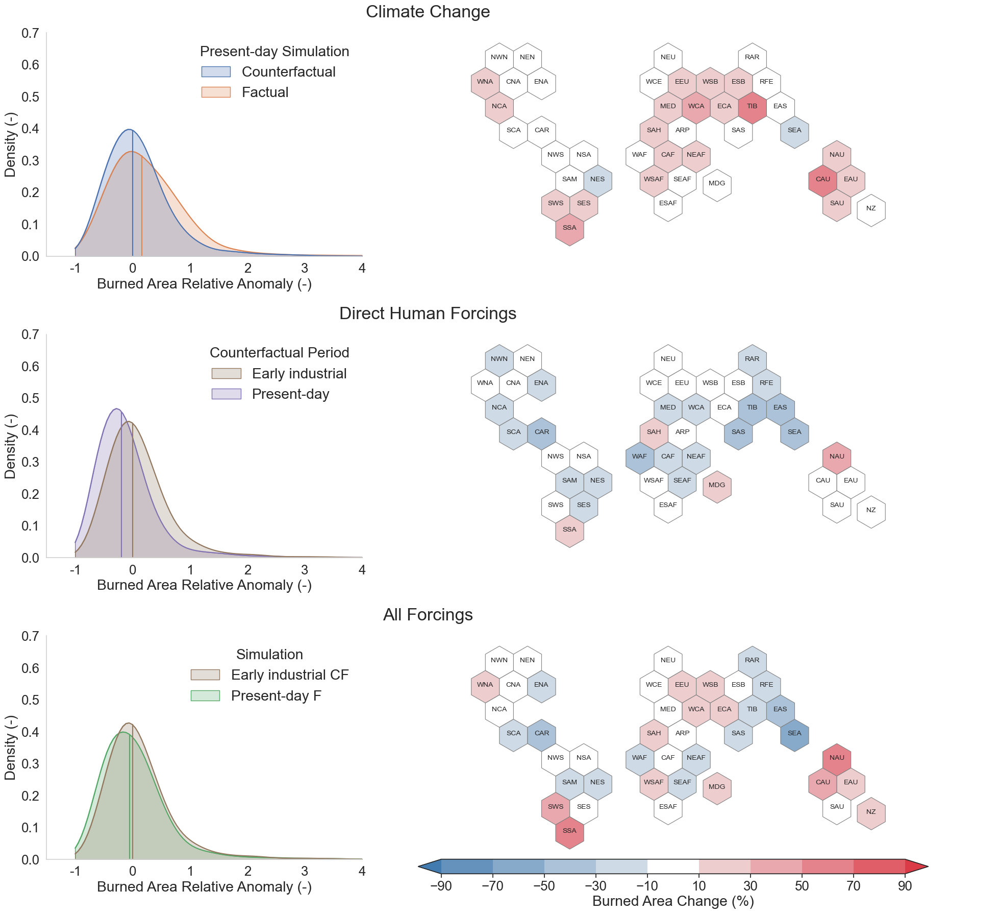

In [31]:
fig, axs = plt.subplots(5, 2, gridspec_kw={'width_ratios': [1, 2], 'height_ratios': [1, 0.35, 1, 0.35, 1], 'wspace': 0, 'hspace': 0}, figsize=(20, 18))
axs = axs.ravel()
sns.set_theme(style='white', font_scale=1.7)
warnings.simplefilter(action="ignore", category=UserWarning)

quick = True # The full figure takes quite a while to load due to the large kde plots, setting this value to True will generate the figure with a smaller subset of the data which is defined by the 'size' variable below
size = 50000 # Number of samples to use if quick=True

xlim = [-1.5, 4]
ylim = [0, 0.7]

xlabel = 'Burned Area Relative Anomaly (-)'
x_lim_int = np.ceil(np.array(xlim)).astype(np.int8)
x_ticks = np.linspace(*x_lim_int, num=x_lim_int[1]-x_lim_int[0]+1).astype(np.int8)
y_lim_int = np.ceil(np.array(ylim)*10).astype(np.int8)
y_ticks = np.linspace(*y_lim_int, num=y_lim_int[1]-y_lim_int[0]+1)/10
kde_kwargs = {'bw_adjust': 2.5, 'clip': [-1, 10], 'x': xlabel}

boundaries = np.arange(-90, 91, 20)
n_colors = len(boundaries) + 1
cmap = sns.diverging_palette(245, 10, sep=1, n=n_colors)
cmap[n_colors//2] = [1]*3
cmap = mcolors.ListedColormap(cmap)
norm = mcolors.BoundaryNorm(boundaries=boundaries, ncolors=len(boundaries)+1, extend='both')
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)


hexagons = gpd.read_file(os.path.join(SUPPLEMENTARY_DATA_PATH, 'ipcc-master', 'zones.gpkg')).rename(columns={'label': 'Region'})
hexagons = hexagons.set_index('Region')

# Figure 1a
keys = ['Counterfactual   ', 'Factual']
data = pd.concat([counterclim_pd_ra_plus_error_plus_weights_global_resampled, obsclim_pd_ra_counterclim_pd_plus_error_plus_weights_global_resampled], keys=keys, names=['Present-day Simulation'], axis=0).reset_index().drop(columns='level_1').rename(columns={'RA': xlabel})

if quick: data = data.loc[data.index.size//2-size:data.index.size//2+size]

ax = axs[0]
kdeplot = sns.kdeplot(data, hue='Present-day Simulation', hue_order=keys, ax=ax, palette='cmap_1a', fill=False, legend=False, **kde_kwargs)
sns.kdeplot(data, hue='Present-day Simulation', ax=ax, hue_order=keys, palette='cmap_1a', fill=True, **kde_kwargs)

height = np.interp(counterclim_pd_ra_plus_error_plus_weights_global_resampled.median(), kdeplot.lines[1].get_xdata(), kdeplot.lines[1].get_ydata())/ylim[1]
ax.axvline(x=counterclim_pd_ra_plus_error_plus_weights_global_resampled.median(), ymin=0, ymax=height, c=color_dict['blue'])

height = np.interp(obsclim_pd_ra_counterclim_pd_plus_error_plus_weights_global_resampled.median(), kdeplot.lines[0].get_xdata(), kdeplot.lines[0].get_ydata())/ylim[1]
ax.axvline(x=obsclim_pd_ra_counterclim_pd_plus_error_plus_weights_global_resampled.median(), ymin=0, ymax=height, c=color_dict['orange'])

ax.set_ylim(ylim)
ax.set_xlim(xlim)
sns.despine(ax=ax)
ax.set_xticks(ticks=x_ticks, labels=x_ticks)
ax.set_yticks(ticks=y_ticks, labels=y_ticks)
ax.spines['bottom'].set_color('lightgrey')
ax.spines['left'].set_color('lightgrey')

sns.move_legend(ax, loc='upper right', frameon=False, fontsize='medium', title_fontsize='medium')
#ax.text(s='a)', x=ax.viewLim.get_points()[0, 0]-0.8, y=ax.viewLim.get_points()[1, 1])
ax.set_ylabel('Density (-)', fontsize=20)



# Figure 1b
ax = axs[1]
hexagons_1 = pd.merge(hexagons, (obsclim_pd_ra_counterclim_pd_results_final[0.5]).to_frame().rename(columns={0.5: 'Burned Area Change'}), on='Region')
hexagons_1.plot(column='Burned Area Change', cmap=cmap, norm=norm, linewidth=0.8, edgecolor='gray', legend=False, ax=ax)
hexagons_1.apply(lambda x: ax.annotate(text=x.name, xy=x.geometry.centroid.coords[0], ha='center', fontsize=10), axis=1)

ax.set_axis_off()
ax.set_title('Climate Change', x=-0.05, y=1.05, fontsize='large')
#ax.text(s='b)', x=ax.viewLim.get_points()[0, 0], y=ax.viewLim.get_points()[1, 1])


# Figure 1c
keys=['Early industrial', 'Present-day']
data = pd.concat([counterclim_ei_ra_plus_error_plus_weights_global_resampled, counterclim_pd_ra_counterclim_ei_plus_error_plus_weights_global_resampled], keys=keys, names=['Counterfactual Period'], axis=0).reset_index().drop(columns='level_1').rename(columns={'RA': xlabel})

if quick: data = data.loc[data.index.size//2-size:data.index.size//2+size]

ax = axs[4]
green_purple = sns.diverging_palette(145, 300, s=60, n=2)
kdeplot = sns.kdeplot(data, hue='Counterfactual Period', ax=ax, hue_order=keys, palette='cmap_1c', fill=False, legend=False, **kde_kwargs)
sns.kdeplot(data, hue='Counterfactual Period', ax=ax, hue_order=keys, palette='cmap_1c', fill=True, **kde_kwargs)

median = counterclim_ei_ra_plus_error_plus_weights_global_resampled.median()
height = np.interp(median, kdeplot.lines[1].get_xdata(), kdeplot.lines[1].get_ydata())/ylim[1]
ax.axvline(x=median, ymin=0, ymax=height, c=color_dict['brown'])

median = counterclim_pd_ra_counterclim_ei_plus_error_plus_weights_global_resampled.median()
height = np.interp(median, kdeplot.lines[0].get_xdata(), kdeplot.lines[0].get_ydata())/ylim[1]
ax.axvline(x=median, ymin=0, ymax=height, c=color_dict['purple'])

ax.set_ylim(ylim)
ax.set_xlim(xlim)
sns.despine(ax=ax)
ax.set_xticks(ticks=x_ticks, labels=x_ticks)
ax.set_yticks(ticks=y_ticks, labels=y_ticks)
ax.spines['bottom'].set_color('lightgrey')
ax.spines['left'].set_color('lightgrey')

sns.move_legend(ax, loc='upper right', frameon=False, fontsize='medium', title_fontsize='medium')
#ax.text(s='c)', x=ax.viewLim.get_points()[0, 0]-0.8, y=ax.viewLim.get_points()[1, 1])
ax.set_ylabel('Density (-)', fontsize=20)


# Figure 1d
ax = axs[5]
hexagons_2 = pd.merge(hexagons, (counterclim_pd_ra_counterclim_ei_results_final[0.5]).to_frame().rename(columns={0.5: 'Burned Area Change'}), on='Region')
hexagons_2.plot(column='Burned Area Change', cmap=cmap, norm=norm, linewidth=0.8, edgecolor='gray', legend=False, ax=ax)
hexagons_2.apply(lambda x: ax.annotate(text=x.name, xy=x.geometry.centroid.coords[0], ha='center', fontsize=10), axis=1)

ax.set_axis_off()
ax.set_title('Direct Human Forcings', x=-0.05, y=1.05, fontsize='large')
#ax.text(s='d)', x=ax.viewLim.get_points()[0, 0], y=ax.viewLim.get_points()[1, 1])


# Figure 1e
keys=['Early industrial CF', 'Present-day F']
data = pd.concat([counterclim_ei_ra_plus_error_plus_weights_global_resampled, obsclim_pd_ra_counterclim_ei_plus_error_plus_weights_global_resampled], keys=keys, names=['Simulation'], axis=0).reset_index().drop(columns='level_1').rename(columns={'RA': xlabel})

if quick: data = data.loc[data.index.size//2-size:data.index.size//2+size]

ax = axs[8]
kdeplot = sns.kdeplot(data, hue='Simulation', ax=ax, hue_order=keys, palette='cmap_1e', fill=False, legend=False, **kde_kwargs)
sns.kdeplot(data, hue='Simulation', ax=ax, hue_order=keys, palette='cmap_1e', fill=True, **kde_kwargs)

median = counterclim_ei_ra_plus_error_plus_weights_global_resampled.median()
height = np.interp(median, kdeplot.lines[1].get_xdata(), kdeplot.lines[1].get_ydata())/ylim[1]
ax.axvline(x=median, ymin=0, ymax=height, c=color_dict['brown'])

median = obsclim_pd_ra_counterclim_ei_plus_error_plus_weights_global_resampled.median()
height = np.interp(median, kdeplot.lines[0].get_xdata(), kdeplot.lines[0].get_ydata())/ylim[1]
ax.axvline(x=median, ymin=0, ymax=height, c=color_dict['green'])

ax.set_ylim(ylim)
ax.set_xlim(xlim)
sns.despine(ax=ax)
ax.set_xticks(ticks=x_ticks, labels=x_ticks)
ax.set_yticks(ticks=y_ticks, labels=y_ticks)
ax.spines['bottom'].set_color('lightgrey')
ax.spines['left'].set_color('lightgrey')

sns.move_legend(ax, loc='upper right', frameon=False, fontsize='medium', title_fontsize='medium')
#ax.text(s='e)', x=ax.viewLim.get_points()[0, 0]-0.8, y=ax.viewLim.get_points()[1, 1])
ax.set_ylabel('Density (-)', fontsize=20)


# Figure 1f
ax = axs[9]
hexagons_2 = pd.merge(hexagons, (obsclim_pd_ra_counterclim_ei_results_final[0.5]).to_frame().rename(columns={0.5: 'Burned Area Change'}), on='Region')
hexagons_2.plot(column='Burned Area Change', cmap=cmap, norm=norm, linewidth=0.8, edgecolor='gray', legend=False, ax=ax)
hexagons_2.apply(lambda x: ax.annotate(text=x.name, xy=x.geometry.centroid.coords[0], ha='center', fontsize=10), axis=1)

ax.set_axis_off()
ax.set_title('All Forcings', x=-0.05, y=1.05, fontsize='large')
#ax.text(s='f)', x=ax.viewLim.get_points()[0, 0], y=ax.viewLim.get_points()[1, 1])

# Formatting

axs[2].set_axis_off()
axs[3].set_axis_off()

axs[6].set_axis_off()
axs[7].set_axis_off()

cbax = fig.add_axes([0.42, 0.04, 0.5, 0.25])
cbax.set_axis_off()
plt_cbar = plt.colorbar(cbar, orientation='horizontal', label='Burned Area Change (%)', extend='both', pad=0.05, fraction=0.25, aspect=35, ax=cbax, anchor=(0.5, -0.01))

plt.tight_layout()
plt.savefig(os.path.join(FIGURES_PATH, 'Figure 1.pdf'), dpi=600, bbox_inches='tight', transparent=True)

#### Figure 2

Reuses some of the variables of Figure 1, please run Figure 1 first.

##### PR CC Forcing

In [38]:
counterclim_pd_ra_plus_error_plus_weights_global = counterclim_pd_ra_plus_error_plus_weights.loc[counterclim_pd_ra_plus_error_plus_weights.Region == 'Global']
counterclim_pd_ra_results = counterclim_pd_ra_plus_error_plus_weights_global.groupby('idx').progress_apply(lambda df: get_results_global(df, num_resamples=num_resamples))

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:08<00:00, 122.04it/s]


In [39]:
def get_median_and_fraction(df, num_resamples, other_mean=False):
    series = df.sample(n=num_resamples, replace=True, weights='weights', random_state=create_rng(SEED))['RA']
    if not other_mean:
        other_mean = series.median()
    fraction = (series>other_mean).mean()
    return pd.Series([other_mean, fraction], index=['median', 'fraction'])

In [40]:
counterclim_pd_ra_mean_and_fraction = counterclim_pd_ra_plus_error_plus_weights.groupby(['idx', 'Region'], observed=True).progress_apply(lambda df: get_median_and_fraction(df, num_resamples=num_resamples))
obsclim_pd_ra_counterclim_pd_fraction = obsclim_pd_ra_counterclim_pd_plus_error_plus_weights.groupby(['idx', 'Region'], observed=True).progress_apply(lambda df: get_median_and_fraction(df, num_resamples=num_resamples, other_mean=counterclim_pd_ra_mean_and_fraction.loc[df.name, 'median']).loc['fraction'])

Progress bar: 100%|█████████████████████████████████████████████████████████████| 44000/44000 [01:42<00:00, 427.97it/s]


In [41]:
PR_CC_results = (obsclim_pd_ra_counterclim_pd_fraction/counterclim_pd_ra_mean_and_fraction.loc[slice(None), 'fraction']).groupby('Region', observed=True).quantile(quantiles_result).unstack()
#print(PR_CC_results.groupby('Region', observed=True).apply(lambda row: f'{row[quantiles_result[1]].values.item():.2f} [{row[quantiles_result[0]].values.item():.2f}, {row[quantiles_result[2]].values.item():.2f}]')[custom_order_idx].to_string(index=False))

In [42]:
obsclim_pd_ra_counterclim_pd_plus_error_plus_weights_global = obsclim_pd_ra_counterclim_pd_plus_error_plus_weights.loc[obsclim_pd_ra_counterclim_pd_plus_error_plus_weights.Region == 'Global']
obsclim_pd_ra_counterclim_pd_results = obsclim_pd_ra_counterclim_pd_plus_error_plus_weights_global.groupby('idx').progress_apply(lambda df: get_results_global(df, num_resamples=num_resamples, quantiles=deepcopy(counterclim_pd_ra_results.loc[df.name]))['fraction'])

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:06<00:00, 146.47it/s]


In [43]:
pi = [0.1, 0.5, 0.9]
PRs_CC = obsclim_pd_ra_counterclim_pd_results.stack('Quantile')/counterclim_pd_ra_results['fraction']
obsclim_pd_ra_counterclim_pd_results_summarized = PRs_CC.groupby('Quantile').quantile(q=quantiles_result)
obsclim_pd_ra_counterclim_pd_results_summarized.index = obsclim_pd_ra_counterclim_pd_results_summarized.index.rename({None: 'PR of Burned Area'})
obsclim_pd_ra_counterclim_pd_results_summarized = obsclim_pd_ra_counterclim_pd_results_summarized.unstack('PR of Burned Area')

##### PR DHF Forcing

In [32]:
counterclim_ei_ra_plus_error_plus_weights_global = counterclim_ei_ra_plus_error_plus_weights.loc[counterclim_ei_ra_plus_error_plus_weights.Region == 'Global']
counterclim_ei_ra_results = counterclim_ei_ra_plus_error_plus_weights_global.groupby('idx').progress_apply(lambda df: get_results_global(df, num_resamples=num_resamples))

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 184.94it/s]


In [33]:
counterclim_pd_ra_counterclim_ei_plus_error_plus_weights_global = counterclim_pd_ra_counterclim_ei_plus_error_plus_weights.loc[counterclim_pd_ra_counterclim_ei_plus_error_plus_weights.Region == 'Global']
counterclim_pd_ra_counterclim_ei_results = counterclim_pd_ra_counterclim_ei_plus_error_plus_weights_global.groupby('idx').progress_apply(lambda df: get_results_global(df, num_resamples=num_resamples, quantiles=deepcopy(counterclim_ei_ra_results.loc[df.name]))['fraction'])

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 230.05it/s]


In [34]:
PRs_DHF = (counterclim_pd_ra_counterclim_ei_results.stack('Quantile')/counterclim_ei_ra_results['fraction'])
counterclim_pd_ra_counterclim_ei_results_summarized = PRs_DHF.groupby('Quantile').quantile(q=quantiles_result)
counterclim_pd_ra_counterclim_ei_results_summarized.index = counterclim_pd_ra_counterclim_ei_results_summarized.index.rename({None: 'PR of Burned Area'})
counterclim_pd_ra_counterclim_ei_results_summarized = counterclim_pd_ra_counterclim_ei_results_summarized.unstack('PR of Burned Area')

##### PR ALL Forcing

In [35]:
obsclim_pd_ra_counterclim_ei_plus_error_plus_weights_global = obsclim_pd_ra_counterclim_ei_plus_error_plus_weights.loc[obsclim_pd_ra_counterclim_ei_plus_error_plus_weights.Region == 'Global']
obsclim_pd_ra_counterclim_ei_results = obsclim_pd_ra_counterclim_ei_plus_error_plus_weights_global.groupby('idx').progress_apply(lambda df: get_results_global(df, num_resamples=num_resamples, quantiles=deepcopy(counterclim_ei_ra_results.loc[df.name]))['fraction'])

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 204.29it/s]


In [36]:
PRs_ALL = (obsclim_pd_ra_counterclim_ei_results.stack('Quantile')/counterclim_ei_ra_results['fraction'])
obsclim_pd_ra_counterclim_ei_results_summarized = PRs_ALL.groupby('Quantile').quantile(q=quantiles_result)
obsclim_pd_ra_counterclim_ei_results_summarized.index = obsclim_pd_ra_counterclim_ei_results_summarized.index.rename({None: 'PR of Burned Area'})
obsclim_pd_ra_counterclim_ei_results_summarized = obsclim_pd_ra_counterclim_ei_results_summarized.unstack('PR of Burned Area')

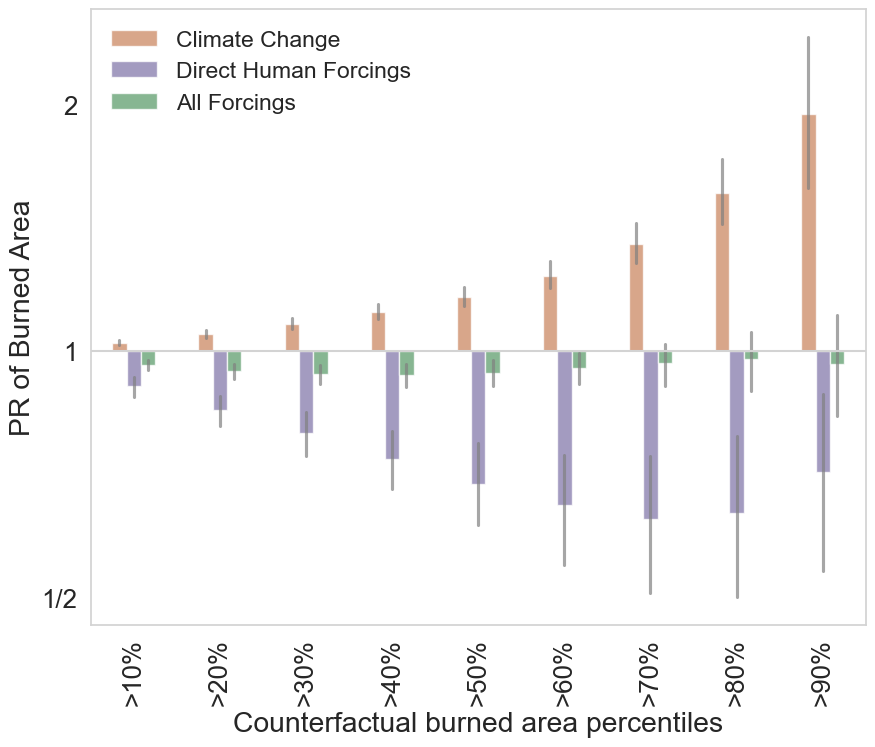

In [44]:
xlabel = 'Counterfactual burned area percentiles'
ylabel = 'PR of Burned Area'
keys=['Climate Change', 'Direct Human Forcings', 'All Forcings']

fig2_df_scaled = pd.concat([PRs_CC, PRs_DHF, PRs_ALL], keys=['CC', 'DHF', 'ALL']).apply(scale_values_fig_2).reset_index().rename(columns={'level_0': 'Forcing', 'Quantile': xlabel, 0: ylabel})
fig2_df_scaled = pd.concat([obsclim_pd_ra_counterclim_pd_results_summarized, counterclim_pd_ra_counterclim_ei_results_summarized, obsclim_pd_ra_counterclim_ei_results_summarized], keys=keys).apply(scale_values_fig_2).reset_index().rename(columns={'level_0': 'Forcing', 'Quantile': xlabel})
fig2_df_scaled = pd.DataFrame(fig2_df_scaled.set_index(['Forcing', xlabel]))
fig2_df_scaled.columns.name = 'Quantile'
fig2_df_scaled = pd.DataFrame(fig2_df_scaled.stack('Quantile')).rename(columns={0: ylabel})
fig, ax = plt.subplots(figsize=(10, 8))
sns.set_theme(style='ticks', font_scale=1.5)

bars = sns.barplot(fig2_df_scaled, x=xlabel, y=ylabel, hue='Forcing', width=0.5, palette=[color_dict['orange'], color_dict['purple'], color_dict['green']], alpha=0.75, ax=ax, estimator='median', errorbar=('pi', 100), err_kws={'color': 'grey', 'alpha': 0.7})

bars.set_xticks(np.arange(9), labels=[f'>{num}%' for num in range(10, 100, 10)])
bars.set_xticklabels([f'>{num}%' for num in range(10, 100, 10)], rotation=90)     
bars.set_yticks([-1.0, 0.0, 1.0], labels=['1/2', '1', '2'])
bars.tick_params(color='lightgrey')

bars.axhline(y=0.0, color='lightgrey')
bars.legend(frameon=False)
for key in bars.spines:
    bars.spines[key].set_color('lightgrey')

plt.savefig(os.path.join(FIGURES_PATH, 'Figure 2.pdf'), dpi=400, bbox_inches='tight', transparent=True)

#### Figure 3

Let's generate the underlying data, we create the 21-year rolling mean relative anomaly for eahc of the models in each region. <br>
Then we multiply it by the model weights for each region. <br>
Third, we drop ORCHIDEE from the ARP region since it has some NaNs (ORCHIDEE ARP counterfactual has a number of months with 0 burned area, making the calculation of relative anomaly impossible). We also rescale the weights of the remaining models so they sum up to 1 gain. <br>
Then we sum for each region and add the CO2 data.

New Preprocessing

In [45]:
def rolling_relative_anomaly(df1, df2):
    return (df1-df2)/df2

In [46]:
years=20
obsclim_with_global = to_annual(add_global(obsclim_df))
obsclim_rolling_mean = obsclim_with_global.rolling(years, closed='both', min_periods=years//2, center=True).mean()
counterclim_with_global = to_annual(add_global(counterclim_df))
counterclim_rolling_mean = counterclim_with_global.rolling(years, closed='both', min_periods=years//2, center=True).mean()
obsclim_RA = ((obsclim_with_global-obsclim_rolling_mean)/obsclim_rolling_mean).T
counterclim_RA = ((counterclim_with_global-counterclim_rolling_mean)/counterclim_rolling_mean).T
index=pd.MultiIndex.from_product([model_weights.index, *obsclim_RA.index.levels])

In [50]:
rolling_mean_RA = pd.Series(np.nan, index=index).groupby('idx').progress_apply(
    lambda df:
        rolling_relative_anomaly(
            add_error(obsclim_RA, df.name, RMSE_yearly_RA.T)
                .multiply(obsclim_rolling_mean.T).add(obsclim_rolling_mean.T, axis=0) # Undo RA back to absolute BA. This is now the absolute BA again, but with the noise added in
                .T.rolling(years, closed='both', min_periods=years//2, center=True).mean(), # Take the rolling mean of the absolute BA 
            add_error(counterclim_RA, df.name, RMSE_yearly_RA.T)
                .multiply(counterclim_rolling_mean.T).add(counterclim_rolling_mean.T, axis=0)
                .T.rolling(years, closed='both', min_periods=years//2, center=True).mean()).T)

Progress bar: 100%|████████████████████████████████████████████████████████████████| 1000/1000 [01:25<00:00, 11.65it/s]


In [51]:
rolling_mean_RA_resampled = rolling_mean_RA\
.melt(ignore_index=False).rename(columns={'value': 'RA'})\
.join(
    pd.DataFrame(model_weights.stack(['Region', 'Model'])).rename(columns={0: 'weight'}), 
    on=['idx', 'Region', 'Model'])\
.droplevel(['Model'])\
.groupby(['Region', 'Date'], observed=True)\
.progress_apply(lambda df: df.sample(n=num_resamples*10, replace=True, weights='weight').RA).droplevel(-1)

Progress bar: 100%|████████████████████████████████████████████████████████████████| 5236/5236 [04:24<00:00, 19.83it/s]


In [52]:
rolling_mean_RA_quantiles = rolling_mean_RA_resampled.groupby(['Region', 'Date'], observed=True).quantile([0.1, 0.5, 0.9])

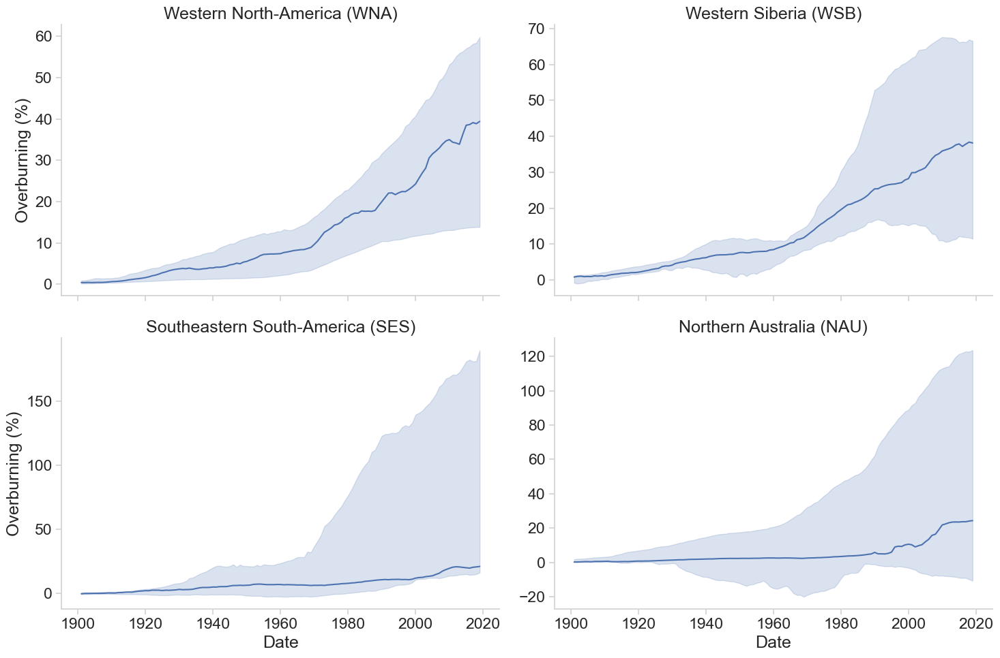

In [53]:
height = 3.5
years = 20
fontsize = 16

regionnames_full = {'WNA': 'Western North-America (WNA)', 'WSB': 'Western Siberia (WSB)', 'SES': 'Southeastern South-America (SES)', 'NAU': 'Northern Australia (NAU)'}
ylabel = 'Overburning (%)'
regionnames_short = {value: key for key, value in regionnames_full.items()}

df = rolling_mean_RA_quantiles.loc[regionnames_full.keys()]
df = df.rename(index=regionnames_full)

sns.set_theme(style='ticks', font_scale=1.5)

g = sns.relplot(data=pd.DataFrame(df).droplevel(None).rename(columns={'RA': ylabel})*100, x='Date', y=ylabel, col='Region', kind='line', col_wrap=2, col_order=regionnames_short.keys(), estimator='median', errorbar=('pi', 100), color=color_dict['blue'], aspect=1.5, facet_kws=dict(sharey=False))
g.set_titles(col_template="{col_name}", fontsize=15)

for ax in g.axes:
    for key in ax.spines:
        ax.spines[key].set_color('lightgrey')
        ax.tick_params(color='lightgrey')

plt.savefig(os.path.join(FIGURES_PATH, 'Figure 3.pdf'), dpi=400, bbox_inches='tight', transparent=True)

#### Extended Data Figure 1

Unfortunately Seaborn doesn't allow (yet) to combine multiple types of FacetGrids in one figure.
It also doesn't (easily) allow to combine different figures together.
Therefore, we'll use subplots here along with a somewhat more manual approach.

In [54]:
warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
warnings.simplefilter(action="ignore", category=RuntimeWarning)

In [55]:
start_year, end_year = 2003, 2019
selected_regions = ['CAU', 'SES','WSB', 'WNA']
xlabel1 = 'Relative Anomaly (%)'

obs = add_global(constrain_time(obs_df, start_year, end_year))
obs_anomaly = obs - obs.mean(axis=0)
obs_relative_anomaly = obs_anomaly/obs.mean(axis=0)*100

obsclim = add_global(constrain_time(obsclim_df, start_year, end_year))
obsclim_anomaly = obsclim - obsclim.mean(axis=0)
obsclim_relative_anomaly = obsclim_anomaly/obsclim.mean(axis=0)*100

obs_model_df = pd.concat([obs_relative_anomaly.rename_axis(['Region', 'Model'], axis=1), obsclim_relative_anomaly], axis=1)
data1 = prepare_for_facetgrid(obs_model_df).rename(columns={'BA': xlabel1})

obs_relative_anomaly_sorted = deepcopy(obs_relative_anomaly)
obs_relative_anomaly_sorted.loc[slice(None)] = np.sort(obs_relative_anomaly.values, axis=0)
obs_relative_anomaly_sorted = obs_relative_anomaly_sorted.reset_index().drop(columns='Date')

obsclim_relative_anomaly_sorted = deepcopy(obsclim_relative_anomaly)
obsclim_relative_anomaly_sorted.loc[slice(None)] = np.sort(obsclim_relative_anomaly.values, axis=0)
obsclim_relative_anomaly_sorted = obsclim_relative_anomaly_sorted.reset_index().drop(columns='Date')

obs_long_df = prepare_for_facetgrid(obs_relative_anomaly_sorted).rename(columns={'BA': f'Observed {xlabel1}', 'Model': 'Observation'})
obsclim_long_df = prepare_for_facetgrid(obsclim_relative_anomaly_sorted).rename(columns={'BA': f'Modelled {xlabel1}'})
data2 = obs_long_df.merge(obsclim_long_df, how="right", on=['index', 'Region'])


f_sp_obs = obs_relative_anomaly.apply(periodogram, axis=0).sort_values(by=['Region', 'Observation'], axis=1)
f_sp_obs.index = ['f', 'sp']
f_sp_obs_df = pd.DataFrame(index=1/f_sp_obs.loc['f'].iloc[0], columns = f_sp_obs.columns)
for row_idx, row in f_sp_obs.melt(ignore_index=False).loc['sp'].iterrows():
    f_sp_obs_df.loc[slice(None), (row.Region, row.Observation)] = row.value
    
    
f_sp_obsclim = obsclim_relative_anomaly.apply(periodogram, axis=0).sort_values(by=['Region', 'Model'], axis=1)
f_sp_obsclim.index = ['f', 'sp']
f_sp_obsclim_df = pd.DataFrame(index=1/f_sp_obsclim.loc['f'].iloc[0], columns = f_sp_obsclim.columns)
for row_idx, row in f_sp_obsclim.melt(ignore_index=False).loc['sp'].iterrows():
    f_sp_obsclim_df.loc[slice(None), (row.Region, row.Model)] = row.value
    
f_sp_df = pd.concat([f_sp_obs_df.rename_axis(['Region', 'Model'], axis=1), f_sp_obsclim_df], axis=1)
data3 = prepare_for_facetgrid(f_sp_df).rename(columns={'BA': 'Variance (Relative Anomaly$^2$)', 'index': 'Period (months)'})

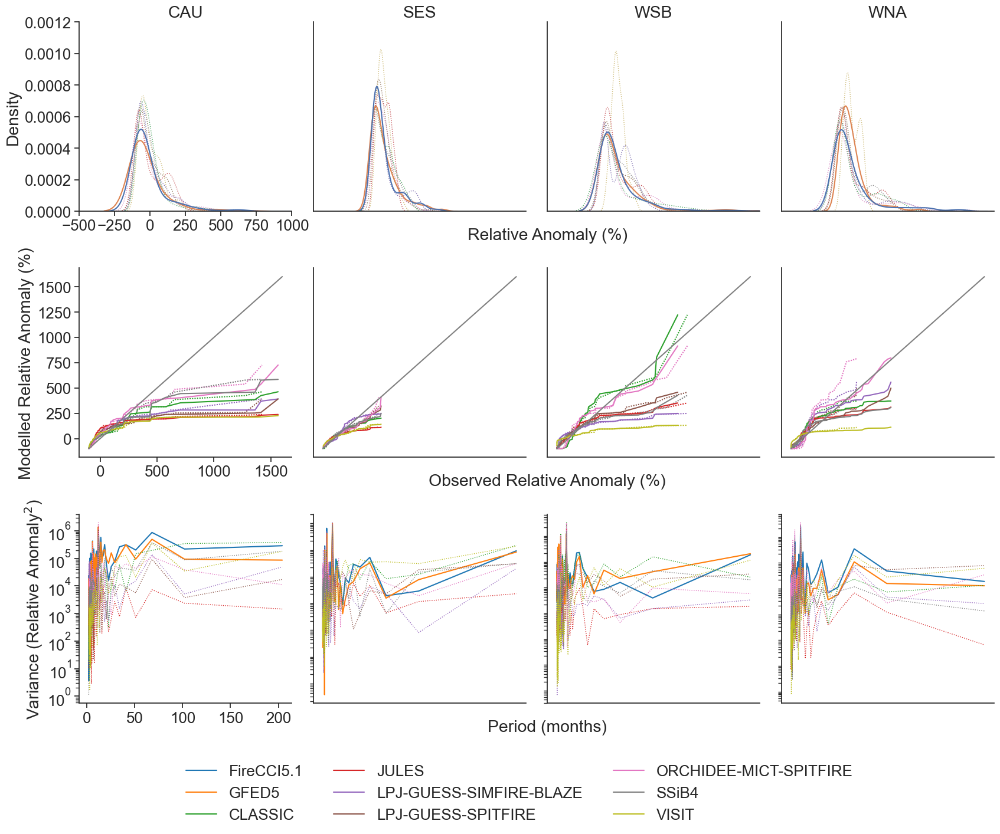

In [56]:
sns.set_theme(font_scale=1.7, style='ticks')
fig, axs = plt.subplots(3, 4, figsize=(20, 15), gridspec_kw={'hspace': 0.3, 'wspace': 0.1})
axs = axs.ravel() 

colors = sns.color_palette("tab10", 9)
obscolors = colors[:2]
modelcolors = colors[2:]

for idx, regionname in enumerate(selected_regions):
    region_axs = [axs[idx], axs[idx+4], axs[idx+8]]
    ax = region_axs[0]
    kde = sns.kdeplot(data1[data1.Region==regionname], x=xlabel1, ax=ax, hue='Model', bw_adjust=1, legend=False, color=colors, linewidth=1)
    
    linestyles = [':']*7 + ['-']*2
    linewidths = [1]*7 + [1.5]*2
    for line, ls, lw in zip(kde.lines, linestyles, linewidths):
        line.set_linestyle(ls)
        line.set_linewidth(lw)

    ax.set_xlim(-500, 1000)
    ax.set_ylim(0, 0.0012)
    ax.set_title(regionname)        
        
    ax = region_axs[1]
    sns.lineplot(data=data2[(data2.Region==regionname) & (data2.Observation=='GFED5')], x=f'Observed {xlabel1}', y=f'Modelled {xlabel1}', hue='Model', ax=ax, dashes=(1, 1), legend=False, palette=modelcolors)
    sns.lineplot(data=data2[(data2.Region==regionname) & (data2.Observation=='FireCCI5.1')], x=f'Observed {xlabel1}', y=f'Modelled {xlabel1}', hue='Model', ax=ax, legend=False, palette=modelcolors)
    line = [-100, 1600]
    sns.lineplot(x=line, y=line, ax=ax, color='grey')
    
    ax = region_axs[2]
    legend = (regionname=='SES')
    power_plot = sns.lineplot(data=data3[data3.Region==regionname], x='Period (months)', y='Variance (Relative Anomaly$^2$)', hue='Model', ax=ax, legend=legend, palette=colors)
    ax.set_yscale('log')
    
    if regionname != 'CAU':
        for ax in region_axs:
            ax.set_ylabel('')
            ax.set_yticks([], [])
            ax.set_xticks([], [])
            
    if regionname == 'SES':
        region_axs[0].set_xlabel(f'                                                       {xlabel1}')
        region_axs[1].set_xlabel(f'                                                       Observed {xlabel1}')
        region_axs[2].set_xlabel(f'                                                       Period (months)') 
        for ax in region_axs:
            ax.xaxis.labelpad = 20
    else:    
        for ax in region_axs:
            ax.set_xlabel('')
            
    for line, ls, lw in zip(power_plot.lines, linestyles[::-1], linewidths[::-1]):
        line.set_linestyle(ls)
        line.set_linewidth(lw)
        
for ax in axs:
    ax.spines[['right', 'top']].set_visible(False)
    
sns.move_legend(axs[9], "lower right", bbox_to_anchor=(2.6, -0.7), frameon=False, ncol=3, title='')
plt.savefig(os.path.join(FIGURES_PATH, 'Extended Data Figure 1.pdf'), dpi=300, bbox_inches='tight')
sns.set_theme()

### Supplementary Figures

#### Supplementary Figure 1

In [57]:
obsclim_dict = {key: model_dict[key]['obsclim'] for key in model_dict.keys()}
obs_obsclim_dict = dict(obs_dict, **obsclim_dict)
obs_model_dict = dict(obs_dict, **model_dict)

C:\Users\slampe\AppData\Local\Temp\ipykernel_24372\4288714352.py:26: FutureWarning: Ignoring a datum in netCDF load for consistency with existing behaviour. In a future version of Iris, this datum will be applied. To apply the datum when loading, use the iris.FUTURE.datum_support flag.
  cube = iris.load_cube(loc)
C:\Users\slampe\AppData\Local\Temp\ipykernel_24372\4288714352.py:26: FutureWarning: Ignoring a datum in netCDF load for consistency with existing behaviour. In a future version of Iris, this datum will be applied. To apply the datum when loading, use the iris.FUTURE.datum_support flag.
  cube = iris.load_cube(loc)


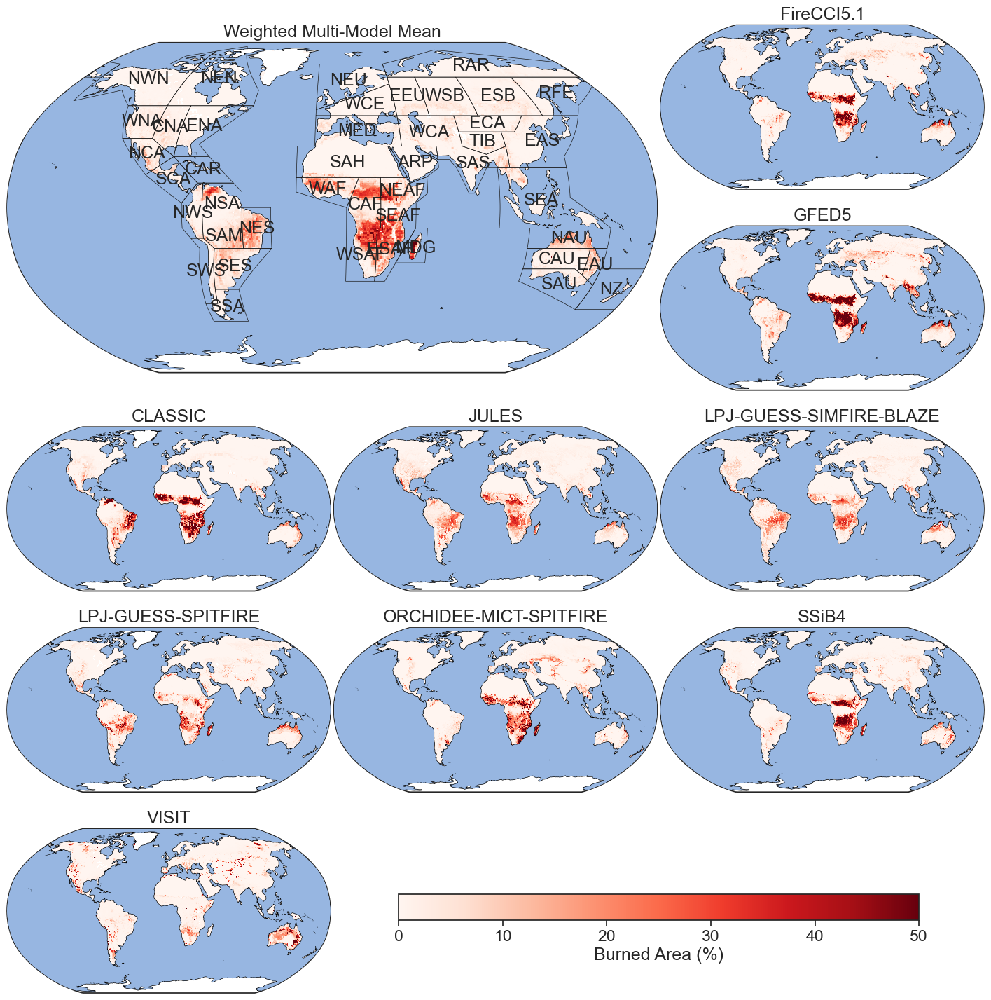

In [135]:
sns.set_theme(font_scale=1.5, style='ticks')
cmap = mpl.colormaps.get_cmap('Reds')  # viridis is the default colormap for imshow
cmap.set_bad(color='white')

figshape = [
    [0, 0, 1],
    [0, 0, 2],
    [3, 4, 5],
    [6, 7, 8],
    [9, 10, 10]
           ]

fig, axs = plt.subplot_mosaic(figshape, figsize=(18, 18), subplot_kw={'projection': ccrs.Robinson()}, gridspec_kw={'wspace': 0.01})

#fig, axs = plt.subplots(6, 3, figsize=(36, 9), subplot_kw={'projection': ccrs.Robinson()}, gridspec_kw={'wspace': 0.01})
#axs = axs.ravel()

weighted_multi_model_mean = np.ma.MaskedArray(data=np.zeros((360, 720)), mask=np.zeros((360, 720)))

obs_model_dict = dict(obs_dict, **model_dict)

# Make the regional plots
for idx, (name, loc) in enumerate(obs_model_dict.items()):
    ax = axs[idx+1]
    if type(loc) == str:
        cube = iris.load_cube(loc)
    else:
        cube = preprocess_model(iris.load_cube(loc['obsclim']), name)
    annual_mean_cube = pixel_mean(to_annual(constrain_time(cube, 2003, 2019)))
    
    mesh=iris.plot.pcolormesh(annual_mean_cube, axes=ax, cmap=cmap, vmin=0, vmax=50)
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(name)
    
    if name in model_dict.keys():
        for regionname in AR6_masks.keys():
            region_weighted_values = annual_mean_cube.data * ~AR6_masks[regionname].data * select_region(select_model(model_weights, name), regionname).mean().item()
            weighted_multi_model_mean += region_weighted_values

# Make the big multi-model mean plot            
annual_mean_cube.data = weighted_multi_model_mean
ax = axs[0]
mesh=iris.plot.pcolormesh(annual_mean_cube, axes=ax, cmap=cmap, vmin=0, vmax=50)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('Weighted Multi-Model Mean')
regionmask.defined_regions.ar6.land.__getitem__(np.arange(1, 44)).plot(ax=ax, label='abbrev', text_kws={'zorder':10, 'bbox': {'alpha': 0}}, line_kws={'lw':0.5, 'zorder':15})

#colorbar_axes = plt.gcf().add_axes([0.285, 0.02, 0.45, 0.04])
colorbar = plt.colorbar(mesh, ax=axs[10], orientation='horizontal', label='Burned Area (%)', fraction = 0.6, shrink=0.8) 
axs[10].set_frame_on(False)
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 1.png'), dpi=600, bbox_inches='tight')

#### Supplementary Figure 2

The code here is similar as Figure 1a, but for two different time periods.

In [62]:
middle_start_year, middle_end_year = 1950, 2019

obsclim_global = to_global(obsclim_df)
counterclim_global = to_global(counterclim_df)
index=pd.MultiIndex.from_product([model_weights.index, obsclim_global.columns])

model_weights_global = select_region(model_weights, 'Global').T.droplevel('Region').T
RMSE_RA_global = select_region(RMSE_RA, 'Global').T.droplevel('Region').T

1901-1920 factual relative anomaly

In [63]:
obsclim_ei = constrain_time(obsclim_global, ei_start_year, ei_end_year)
counterclim_ei = constrain_time(counterclim_global, ei_start_year, ei_end_year)

In [64]:
obsclim_ei_ra_counterclim_ei = relative_anomaly(obsclim_ei, counterclim_ei).replace([np.inf, -np.inf], np.nan)

obsclim_ei_ra_counterclim_ei_plus_error = pd.Series(np.nan, index=index).groupby('idx').progress_apply(lambda idx_df: add_error(obsclim_ei_ra_counterclim_ei, seed=idx_df.name, error=RMSE_RA_global))
obsclim_ei_ra_counterclim_ei_plus_error_plus_weights = pd.DataFrame(obsclim_ei_ra_counterclim_ei_plus_error.stack(['Model'])).rename(columns={0: 'RA'}).merge(model_weights_global.stack(['Model']).reset_index().rename(columns={0: 'weights'}), on=['idx', 'Model']).drop('Model', axis=1)
obsclim_ei_ra_counterclim_ei_plus_error_plus_weights_global_resampled = obsclim_ei_ra_counterclim_ei_plus_error_plus_weights.sample(n=num_resamples*10, replace=True, weights='weights', random_state=create_rng(SEED))['RA']

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 489.50it/s]


1901-1920 counterfactual relative anomaly

In [65]:
counterclim_ei_ra = relative_anomaly(counterclim_ei).replace([np.inf, -np.inf], np.nan)

counterclim_ei_ra_plus_error = pd.Series(np.nan, index=index).groupby('idx').progress_apply(lambda idx_df: add_error(counterclim_ei_ra, seed=idx_df.name, error=RMSE_RA_global))
counterclim_ei_ra_plus_error_plus_weights = pd.DataFrame(counterclim_ei_ra_plus_error.stack(['Model'])).rename(columns={0: 'RA'}).merge(model_weights_global.stack(['Model']).reset_index().rename(columns={0: 'weights'}), on=['idx', 'Model']).drop('Model', axis=1)
counterclim_ei_ra_plus_error_plus_weights_global_resampled = counterclim_ei_ra_plus_error_plus_weights.sample(n=num_resamples*10, replace=True, weights='weights', random_state=create_rng(SEED))['RA']

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 448.25it/s]


1950-2019 factual relative anomaly

In [66]:
obsclim_middle = constrain_time(obsclim_global, middle_start_year, middle_end_year)
counterclim_middle = constrain_time(counterclim_global, middle_start_year, middle_end_year)

In [ ]:
obsclim_middle_ra_counterclim_middle = relative_anomaly(obsclim_middle, counterclim_middle).replace([np.inf, -np.inf], np.nan)

obsclim_middle_ra_counterclim_middle_plus_error = pd.Series(np.nan, index=index).groupby('idx').progress_apply(lambda idx_df: add_error(obsclim_middle_ra_counterclim_middle, seed=idx_df.name, error=RMSE_RA_global))
obsclim_middle_ra_counterclim_middle_plus_error_plus_weights = pd.DataFrame(obsclim_middle_ra_counterclim_middle_plus_error.stack(['Model'])).rename(columns={0: 'RA'}).merge(model_weights_global.stack(['Model']).reset_index().rename(columns={0: 'weights'}), on=['idx', 'Model']).drop('Model', axis=1)
obsclim_middle_ra_counterclim_middle_plus_error_plus_weights_global_resampled = obsclim_middle_ra_counterclim_middle_plus_error_plus_weights.sample(n=num_resamples*10, replace=True, weights='weights', random_state=create_rng(SEED))['RA']

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 231.14it/s]


1950-2019 counterfactual relative anomaly

In [68]:
counterclim_middle_ra = relative_anomaly(counterclim_middle).replace([np.inf, -np.inf], np.nan)

counterclim_middle_ra_plus_error = pd.Series(np.nan, index=index).groupby('idx').progress_apply(lambda idx_df: add_error(counterclim_middle_ra, seed=idx_df.name, error=RMSE_RA_global))
counterclim_middle_ra_plus_error_plus_weights = pd.DataFrame(counterclim_middle_ra_plus_error.stack(['Model'])).rename(columns={0: 'RA'}).merge(model_weights_global.stack(['Model']).reset_index().rename(columns={0: 'weights'}), on=['idx', 'Model']).drop('Model', axis=1)
counterclim_middle_ra_plus_error_plus_weights_global_resampled = counterclim_middle_ra_plus_error_plus_weights.sample(n=num_resamples*10, replace=True, weights='weights', random_state=create_rng(SEED))['RA']

Progress bar: 100%|███████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 248.54it/s]


Create the figure

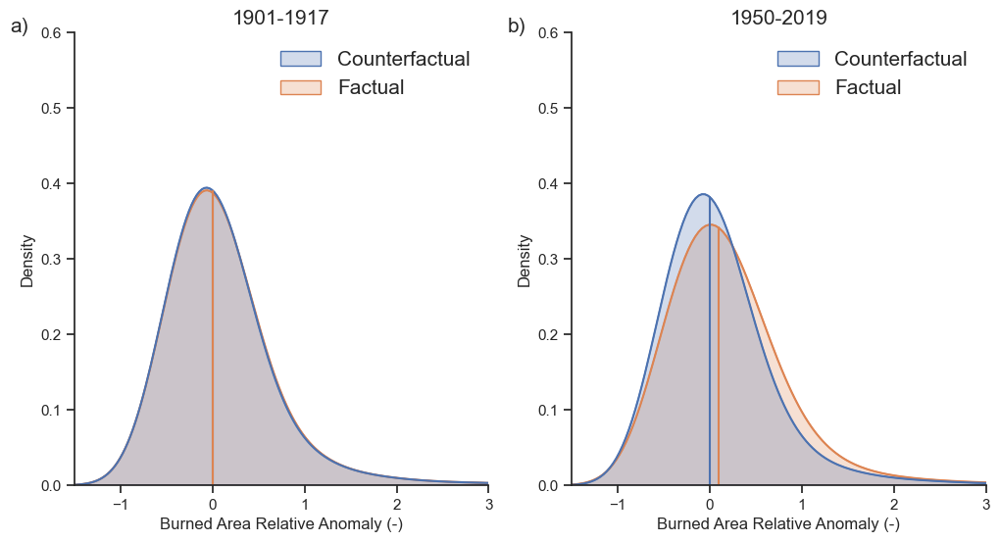

In [131]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs = axs.ravel()
bw_adjust = 4
xlabel = 'Burned Area Relative Anomaly (-)'
xlim = [-1.5, 3]
ylim = [0, 0.6]
gridsize=1000

yearlabel = f'{ei_start_year}-{ei_end_year}'

sns.set_theme(style='white', rc={'axes.titlesize': 15, 'xtick.labelsize': 15, 'ytick.labelsize': 15, 'font.size': 15, 'legend.fontsize': 15, 'legend.title_fontsize': 15, 'axes.labelsize': 15})

ax = axs[0]
data = pd.concat([counterclim_ei_ra_plus_error_plus_weights_global_resampled, obsclim_ei_ra_counterclim_ei_plus_error_plus_weights_global_resampled], keys=['Counterfactual', 'Factual'], names=[yearlabel], axis=0).reset_index().drop('level_1', axis=1).rename(columns={'RA': xlabel})
kdeplot = sns.kdeplot(data, hue=yearlabel, x=xlabel, fill=False, legend=False, ax=ax, bw_adjust=bw_adjust, gridsize=gridsize)
sns.kdeplot(data, hue=yearlabel, x=xlabel, fill=True, ax=ax, bw_adjust=bw_adjust, gridsize=gridsize)

mean = counterclim_ei_ra_plus_error_plus_weights_global_resampled.median()
height = np.interp(mean, kdeplot.lines[0].get_xdata(), kdeplot.lines[0].get_ydata())/ylim[1]
ax.axvline(x=mean, ymin=0, ymax=height, c=color_dict['blue'])

mean = obsclim_ei_ra_counterclim_ei_plus_error_plus_weights_global_resampled.median()
height = np.interp(mean, kdeplot.lines[1].get_xdata(), kdeplot.lines[1].get_ydata())/ylim[1]
ax.axvline(x=mean, ymin=0, ymax=height, c=color_dict['orange'])

ax.set_ylim(ylim)
ax.set_xlim(xlim)
ax.set_title(yearlabel, fontsize='medium')
sns.despine(ax=ax)
sns.move_legend(ax, loc='upper right', frameon=False, fontsize='medium', title_fontsize='medium', title='')
ax.text(s='a)', x=ax.viewLim.get_points()[0, 0]-0.7, y=ax.viewLim.get_points()[1, 1])


ax = axs[1]

yearlabel = f'{middle_start_year}-{middle_end_year}'

data = pd.concat([counterclim_middle_ra_plus_error_plus_weights_global_resampled, obsclim_middle_ra_counterclim_middle_plus_error_plus_weights_global_resampled], keys=['Counterfactual', 'Factual'], names=[yearlabel], axis=0).reset_index().drop('level_1', axis=1).rename(columns={'RA': xlabel})
kdeplot = sns.kdeplot(data, hue=yearlabel, x=xlabel, fill=False, legend=False, ax=ax, bw_adjust=bw_adjust, gridsize=gridsize)
sns.kdeplot(data, hue=yearlabel, x=xlabel, fill=True, ax=ax, bw_adjust=bw_adjust, gridsize=gridsize)

mean = counterclim_middle_ra_plus_error_plus_weights_global_resampled.median()
height = np.interp(mean, kdeplot.lines[1].get_xdata(), kdeplot.lines[1].get_ydata())/ylim[1]
ax.axvline(x=mean, ymin=0, ymax=height, c=color_dict['blue'])

mean = obsclim_middle_ra_counterclim_middle_plus_error_plus_weights_global_resampled.median()
height = np.interp(mean, kdeplot.lines[0].get_xdata(), kdeplot.lines[0].get_ydata())/ylim[1]
ax.axvline(x=mean, ymin=0, ymax=height, c=color_dict['orange'])

ax.set_ylim(ylim)
ax.set_xlim(xlim)
ax.set_title(yearlabel, fontsize='medium')
sns.despine(ax=ax)
sns.move_legend(ax, loc='upper right', frameon=False, fontsize='medium', title_fontsize='medium', title='')
_ = ax.text(s='b)', x=ax.viewLim.get_points()[0, 0]-0.7, y=ax.viewLim.get_points()[1, 1])


plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 2.svg'), dpi=600, bbox_inches='tight')

#### Supplementary Figure 3

Same code as Figure 3, but for all regions instead of the selected 4.
We also don't resample since showing the model spread in these plots makes them quite unreadable. 
Therefore, we can just calculate the weighted model mean and pass it to the relplot function.

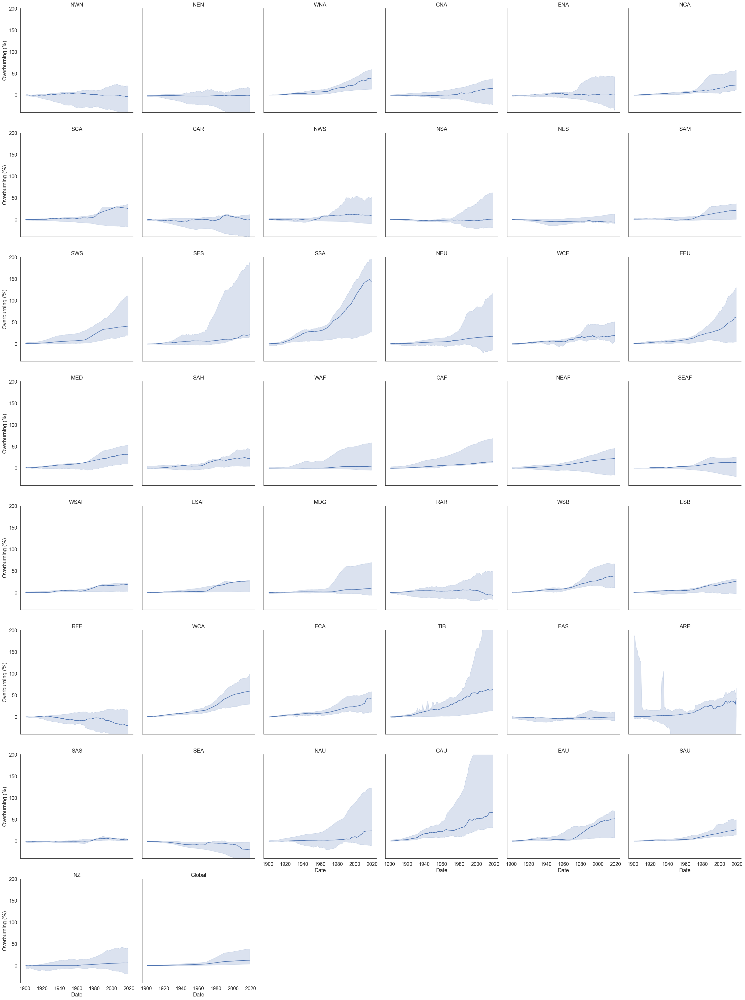

In [118]:
g = sns.relplot(data=pd.DataFrame(rolling_mean_RA_quantiles).droplevel(None).rename(columns={'RA': ylabel})*100, x='Date', y=ylabel, col='Region', kind='line', col_wrap=6, estimator='median', errorbar=('pi', 100), color=color_dict['blue'])
g.set(ylim=[-40, 200])
g.set_titles(col_template="{col_name}", fontsize=15)
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 3.svg'), dpi=600, bbox_inches='tight')

#### Supplementary Figure 4

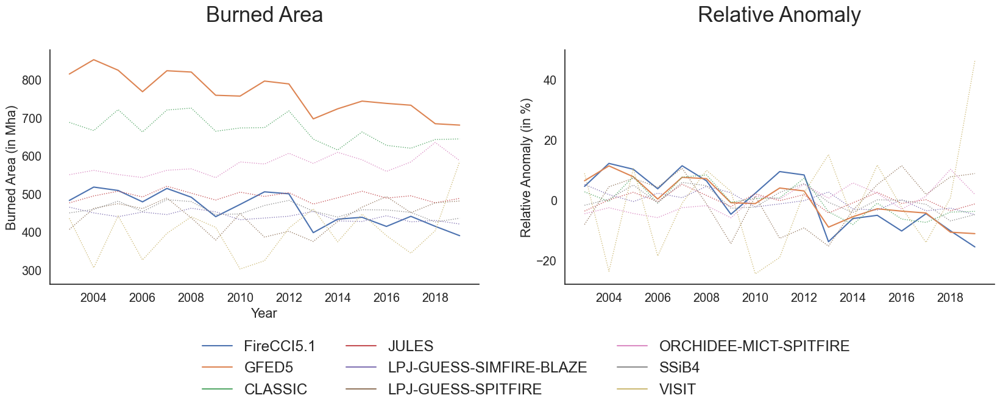

In [119]:
fig, axs = plt.subplots(1, 2, figsize=(20, 5))
axs = axs.ravel()
sns.set_theme(font_scale=1.6, style='ticks')

start_year, end_year = 2003, 2019

obs = constrain_time(to_global(to_annual(obs_df)), start_year, end_year)
obs_anomaly = obs - obs.mean(axis=0)
obs_relative_anomaly = obs_anomaly/obs.mean(axis=0)*100

obsclim = constrain_time(to_global(to_annual(obsclim_df)), start_year, end_year)
counterclim = constrain_time(to_global(to_annual(counterclim_df)), start_year, end_year)

obs_obsclim = pd.concat([obs, obsclim], axis=1)
# Here we calculate the relative anomalies by dividing by the factual mean (as opposed to the counterfactual mean).
# We do this because we need to divide the observations by their own means (they don't have a counterfactual), so we perform the same approach for the simulations.
relative_anomalies = (obs_obsclim-obs_obsclim.mean(axis=0))/obs_obsclim.mean(axis=0)*100
ymin, ymax = min([np.min(series.values) for series in [obs, obsclim, counterclim]]), max([np.max(series.values) for series in [obs, obsclim, counterclim]])

one = sns.lineplot(obs_obsclim, dashes=False, ax=axs[0])
two = sns.lineplot(relative_anomalies, dashes=False, ax=axs[1], legend=False)


one.set_ylim(ymin=ymin-25, ymax=ymax+25)

for ax in axs:
    ax.spines[['right', 'top']].set_visible(False)
    
linestyles = ['-']*2 + [':']*7
linewidths = [1.5]*2 + [1]*7

for line, ls, lw in zip(one.lines, linestyles, linewidths):
    line.set_linestyle(ls)
    line.set_linewidth(lw)
    
for line, ls, lw in zip(two.lines, linestyles, linewidths):
    line.set_linestyle(ls)
    line.set_linewidth(lw)

    
one.set_title('Burned Area', y=1.1, fontdict={'fontsize': 25})
two.set_title('Relative Anomaly', y=1.1, fontdict={'fontsize': 25})

one.set_ylabel('Burned Area (in Mha)')
two.set_ylabel('Relative Anomaly (in %)')

one.set_xlabel('Year')
two.set_xlabel('')

sns.move_legend(one, "upper center", bbox_to_anchor=(1.11, -0.18), frameon=False, ncol=3)

plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 4.svg'), bbox_inches='tight', dpi=600)

#### Supplementary Figure 5

Run Extended Data Figure 1 first.

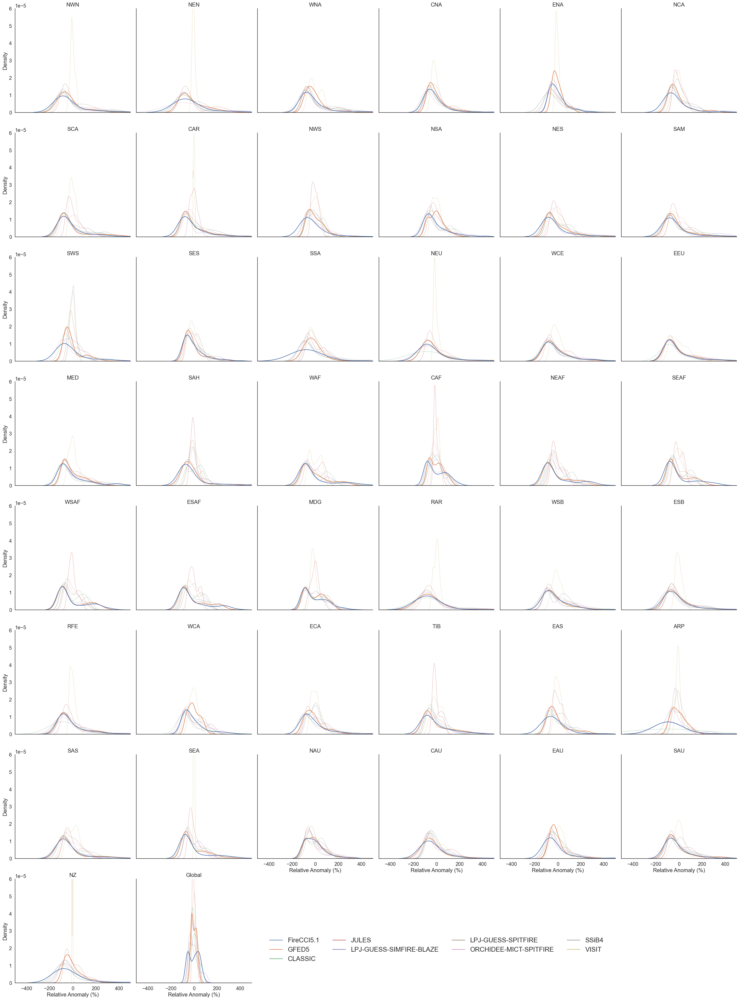

In [124]:
sns.set_theme(style='white', font_scale=1.3)
f_grid = sns.displot(data1, x=xlabel1, col='Region', hue='Model', kind='kde', ax=ax, bw_adjust=1, color=colors, col_wrap=6, facet_kws={'xlim': (-500, 500), 'ylim': (0, 0.00006)})
sns.move_legend(f_grid, "lower right", frameon=False, ncol=4, bbox_to_anchor=(0.73, 0.035), fontsize='large', title='')
f_grid.set_titles(row_template = '{row_name}', col_template = '{col_name}')

linestyles = [':']*7 + ['-']*2
linewidths = [1]*7 + [1.5]*2
for ax in f_grid.axes:
    for line, ls, lw in zip(ax.lines, linestyles, linewidths):
        line.set_linestyle(ls)
        line.set_linewidth(lw)

plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 5.svg'), dpi=600, bbox_inches='tight')
sns.set_theme()

#### Supplementary Figure 6

Run Extended Data Figure 1 first.

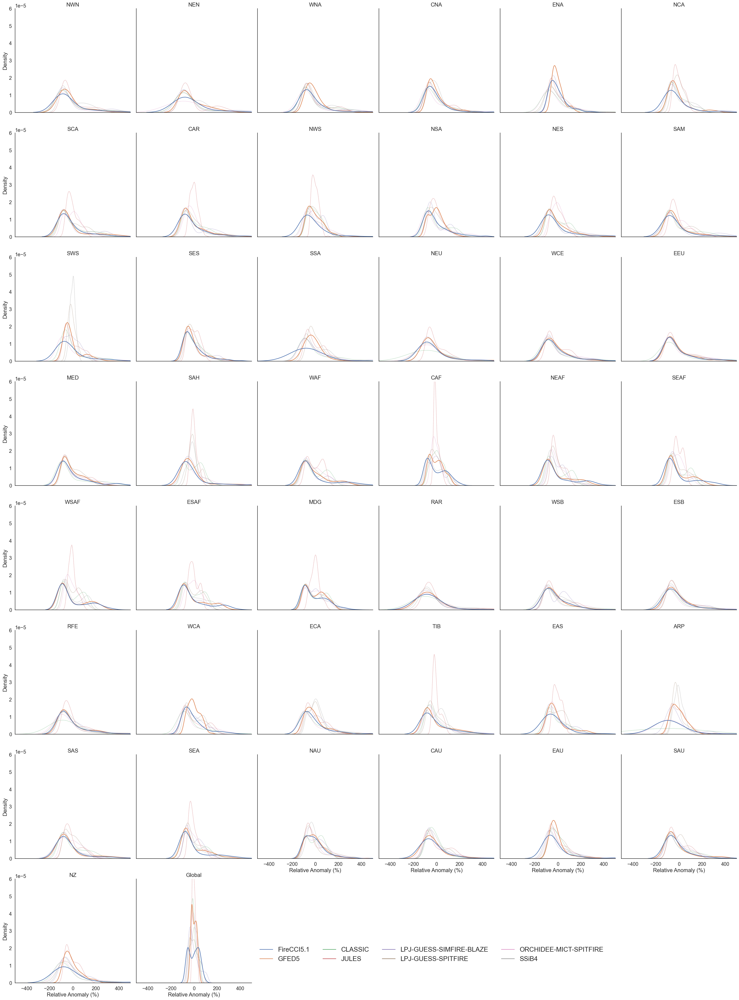

In [125]:
sns.set_theme(style='white', font_scale=1.3)
f_grid = sns.displot(data1[data1.Model != 'VISIT'], x=xlabel1, col='Region', hue='Model', kind='kde', ax=ax, bw_adjust=1, color=colors, col_wrap=6, facet_kws={'xlim': (-500, 500), 'ylim': (0, 0.00006)})#facet_kws={'xlim': (-500, 1000), 'ylim': (0, 0.00006)}
sns.move_legend(f_grid, "lower right", frameon=False, ncol=4, bbox_to_anchor=(0.73, 0.035), fontsize='large', title='')
f_grid.set_titles(row_template = '{row_name}', col_template = '{col_name}')

linestyles = [':']*6 + ['-']*2
linewidths = [1]*6 + [1.5]*2
for ax in f_grid.axes:
    for line, ls, lw in zip(ax.lines, linestyles, linewidths):
        line.set_linestyle(ls)
        line.set_linewidth(lw)

plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 6.svg'), dpi=600, bbox_inches='tight')
sns.set_theme()

#### Supplementary Figure 7

Run Extended Data Figure 1 first.

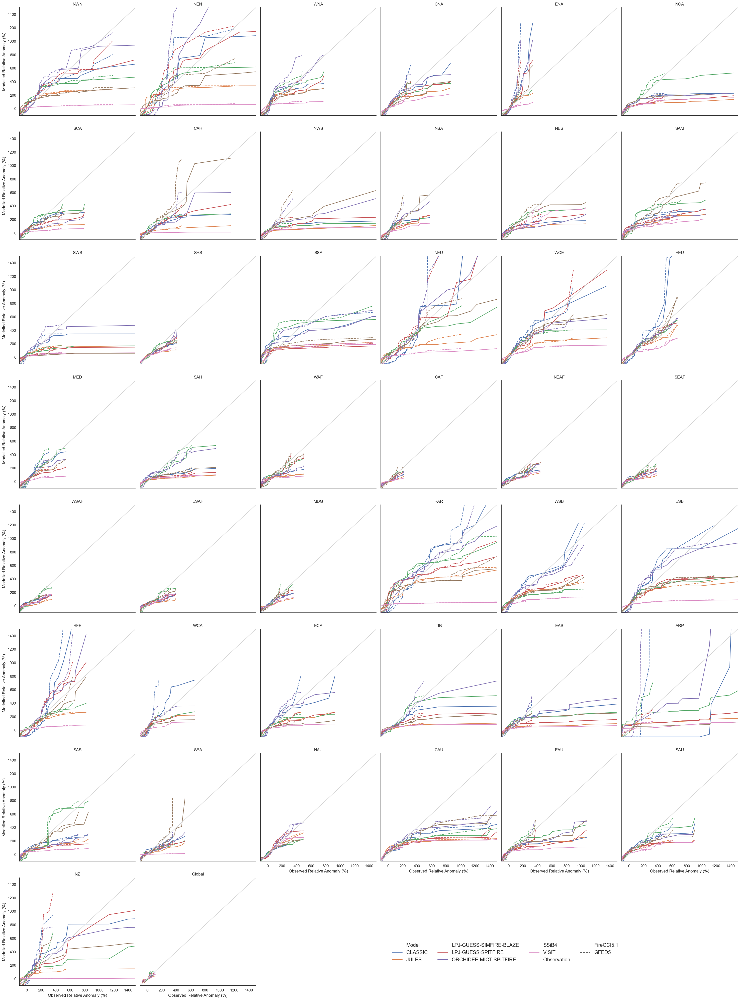

In [126]:
sns.set_theme(style='white', font_scale=1)
lim = [-100, 1500]
f_grid = sns.relplot(data=data2, x='Observed Relative Anomaly (%)', y='Modelled Relative Anomaly (%)', style=data2.Observation, hue='Model', col='Region', col_wrap=6, kind='line', legend=True)
f_grid.set(xlim=lim, ylim=lim)

sns.move_legend(f_grid, "lower right", frameon=False, ncol=4, bbox_to_anchor=(0.77, 0.035), fontsize='large', title='')
f_grid.set_titles(row_template = '{row_name}', col_template = '{col_name}')
for ax in f_grid.axes:
    sns.lineplot(x=lim, y=lim, color='lightgrey', ax=ax, legend=False)

plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 7.svg'), dpi=600, bbox_inches='tight')
sns.set_theme()

#### Supplementary Figure 8

Run Extended Data Figure 1 first.

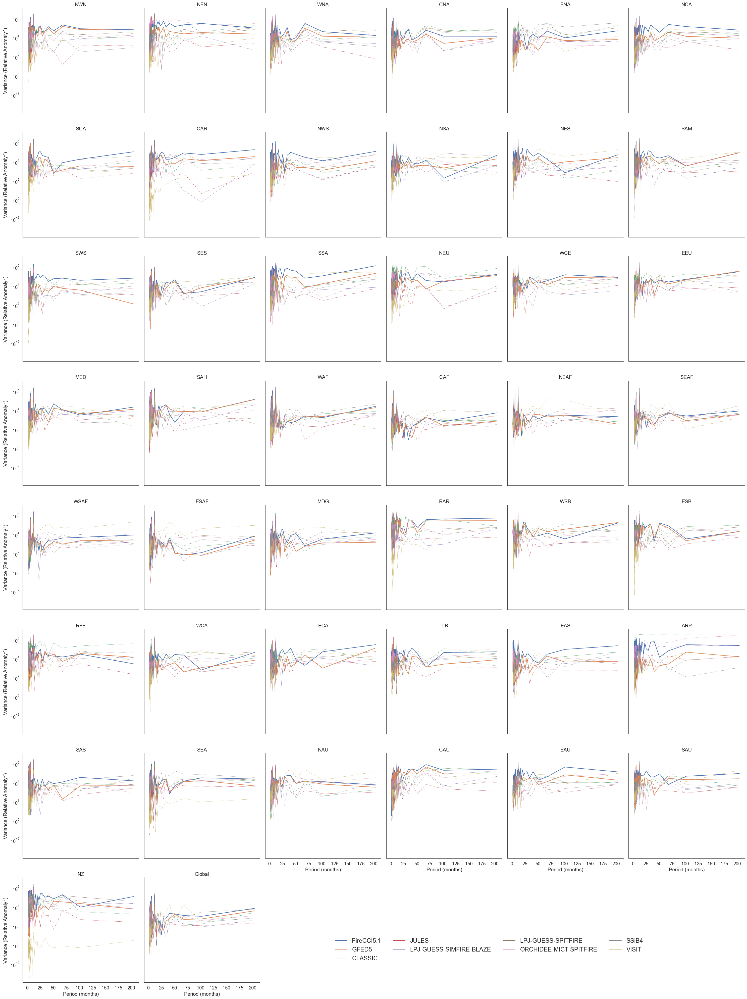

In [127]:
sns.set_theme(style='white', font_scale=1.2)

f_grid = sns.relplot(data=data3, hue='Model', col='Region', col_wrap=6, x='Period (months)', y='Variance (Relative Anomaly$^2$)', kind='line', legend=True)
f_grid.set(yscale='log')
f_grid.set_titles(row_template = '{row_name}', col_template = '{col_name}')

linestyles = ['-']*2 + [':']*7 
linewidths = [1.5]*2 + [1]*7
for ax in f_grid.axes:
    for line, ls, lw in zip(ax.lines, linestyles, linewidths):
        line.set_linestyle(ls)
        line.set_linewidth(lw)

sns.move_legend(f_grid, "lower right", frameon=False, ncol=4, bbox_to_anchor=(0.78, 0.035), fontsize='large', title='')
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 8.svg'), dpi=600, bbox_inches='tight')
sns.set_theme()

#### Supplementary Figure 9

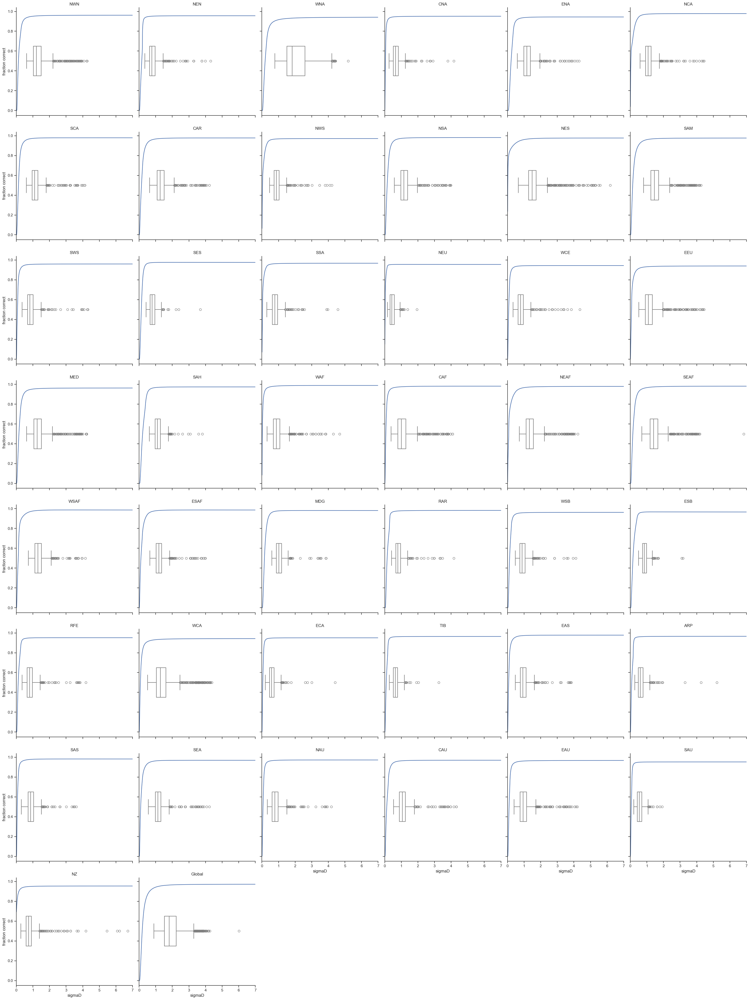

In [129]:
fraction_correct = pd.read_pickle(os.path.join(RESULTS_PATH, 'fraction_correct.pkl'))
optimal_sigmaDs = pd.read_pickle(os.path.join(RESULTS_PATH, 'knees.pkl')).sigmaD.unstack('Region')
sns.set_theme(style='white')
sns.set_theme(style='ticks')
fraction_plot = sns.relplot(fraction_correct.unstack().melt().rename(columns={'value': 'fraction correct'}), col='Region', x='sigmaD', y='fraction correct', kind='line', col_wrap=6)
fraction_plot = fraction_plot.set(xlim=(0, 7))
fraction_plot.set_titles(row_template = '{row_name}', col_template = '{col_name}')
for ax in fraction_plot.axes:
    regionname = ax.title._text.split()[-1]
    sns.boxplot(x=optimal_sigmaDs.loc[slice(None), regionname], y=0.5, fill=False, color='gray', native_scale=True, orient='h', width=0.3, ax=ax)
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 9.svg'), dpi=600, bbox_inches='tight')

## Tables

### Extended Data Tables

#### Extended Data Table 1

In [65]:
start_year, end_year = 2003, 2019
NME_scores = pd.DataFrame(index=pd.MultiIndex.from_tuples([(obs, nme) for obs in ['FireCCI5.1', 'GFED5'] for nme in ['$NME_3$ Rank.', '$NME_3$ Ann.']], names=['Observation', 'NME']), columns=obsclim_df.columns.unique(level='Model'))

for obsname in NME_scores.index.unique(level='Observation'):
    obs = to_global(select_model(constrain_time(obs_df, start_year, end_year), obsname))
    obs_ranked = obs[obsname].sort_values()
    obs_annual = to_annual(obs)[obsname]
    for modelname in NME_scores.columns.unique(level='Model'):
        model = to_global(select_model(constrain_time(obsclim_df, start_year, end_year), modelname))
        model_ranked = model[modelname].sort_values()
        model_annual = to_annual(model)[modelname]
        NME_scores.loc[(obsname), modelname] = [NME3_temporal(obs_ranked, model_ranked), NME3_temporal(obs_annual, model_annual)]
        
NME_scores_styled = NME_scores.astype(np.float64).round(2).style.background_gradient(cmap=sns.color_palette("vlag", as_cmap=True), vmin=0.5, vmax=1.5,axis=None)
NME_scores_styled.to_excel(os.path.join(TABLES_PATH, 'Extended Data Table 1.xlsx'))
NME_scores_styled

### Supplementary Tables

#### Supplementary Table 1

Need to run Fig. 1 and Fig. 2 and Supplementary Fig. 1 first

Create the empty Table

In [136]:
columns = ['Mean Annual BA 2001-2020 GFED5 (Mha)', 'Mean Change CC (%)', 'Mean Change DHF (%)', 'Mean Change All (%)', 'PR due to climate change', '1980-2019 Overburning trend']
table_s1_df = pd.DataFrame(index=custom_order_idx, columns=columns)

Calculate the regional trends

In [137]:
annual_observed_df = add_global(to_annual(select_model(obs_df, 'GFED5'))).mean().droplevel('Observation')[custom_order_idx]

idx_list = np.array(rolling_mean_RA.loc[(slice(None)), 1980:].columns - 1980) # To calculate the trend, we need to modify the x-axis (not from 1980 to 2019, but from 0 to 39)
idx_list = idx_list[np.newaxis, :].repeat(7, axis=0)
rolling_mean_RA_regressed = rolling_mean_RA.loc[(slice(None)), 1980:].dropna().groupby(['idx', 'Region'], observed=True).progress_apply(lambda df: sm.WLS(df.values.flatten(), sm.add_constant(idx_list[:df.index.size].flatten()), weights=np.repeat(pd.DataFrame(model_weights.loc[df.name].loc[df.index.droplevel([0, 1]).values].values), df.columns.size, axis=1).flatten()).fit() if ~model_weights.loc[df.name].isna().any() else np.nan)
trend_results = (rolling_mean_RA_regressed.dropna().groupby(['idx', 'Region'], observed=True).apply(lambda results: results.values.item().params[1]).groupby('Region', observed=True).quantile(quantiles_result)*100).unstack()

Progress bar: 100%|█████████████████████████████████████████████████████████████| 44000/44000 [01:12<00:00, 608.23it/s]


In [138]:
def format_cell(df, decimals):
    return f'{df.loc[quantiles_result[1]].round(decimals)} [{df.loc[quantiles_result[0]].round(decimals)}, {df.loc[quantiles_result[2]].round(decimals)}]'

In [140]:
for regionname in table_s1_df.index:
    mean_change_cc = format_cell(obsclim_pd_ra_counterclim_pd_results_final.loc[regionname], 1)
    mean_change_dhf = format_cell(counterclim_pd_ra_counterclim_ei_results_final.loc[regionname], 1)
    mean_change_all = format_cell(obsclim_pd_ra_counterclim_ei_results_final.loc[regionname], 1)
    pr_cc = format_cell(PR_CC_results.loc[regionname], 2)
    trend = format_cell(trend_results.loc[regionname], 2)
    table_s1_df.loc[regionname] = (annual_observed_df.loc[regionname], mean_change_cc, mean_change_dhf, mean_change_all, pr_cc, trend)

In [141]:
table_s1_styled = table_s1_df.style.format(precision=2)
table_s1_styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 1.xlsx'))
table_s1_styled

,Mean Annual BA 2001-2020 GFED5 (Mha),Mean Change CC (%),Mean Change DHF (%),Mean Change All (%),PR due to climate change,1980-2019 Overburning trend
Global,783.07,"15.8 [13.1, 18.7]","-19.1 [-21.9, -15.8]","-5.0 [-7.6, -2.3]","1.22 [1.18, 1.26]","0.22 [0.22, 0.24]"
ARP,0.04,"-1.3 [-9.2, 7.6]","-9.3 [-17.4, -4.0]","2.4 [-5.7, 9.8]","0.99 [0.96, 1.04]","0.43 [-0.08, 1.18]"
CAF,150.04,"20.3 [16.4, 24.7]","-14.2 [-19.1, -9.2]","3.2 [-2.0, 8.7]","1.14 [1.11, 1.18]","0.31 [0.29, 0.34]"
CAR,1.16,"-7.2 [-12.1, -2.5]","-36.8 [-44.2, -31.0]","-39.2 [-46.3, -33.3]","0.95 [0.92, 0.98]","-0.06 [-0.1, -0.01]"
CAU,10.56,"61.9 [50.0, 78.7]","-8.4 [-13.8, -3.3]","46.9 [37.3, 60.1]","1.33 [1.28, 1.4]","3.04 [2.36, 3.9]"
CNA,3.20,"8.1 [4.5, 11.7]","-1.2 [-7.2, 4.5]","5.8 [-0.2, 11.8]","1.06 [1.03, 1.08]","0.19 [0.15, 0.23]"
EAS,13.00,"0.8 [-3.5, 5.0]","-38.1 [-46.1, -31.8]","-37.6 [-45.8, -31.1]","1.01 [0.98, 1.03]","-0.01 [-0.04, 0.03]"
EAU,5.14,"27.7 [22.8, 33.9]","2.3 [-3.4, 8.2]","27.8 [19.8, 35.8]","1.18 [1.14, 1.21]","0.71 [0.64, 0.77]"
ECA,0.91,"27.7 [22.4, 34.4]","-4.4 [-10.3, 1.0]","21.1 [13.9, 28.3]","1.14 [1.11, 1.17]","0.56 [0.5, 0.62]"
EEU,11.09,"12.3 [8.4, 17.1]","-2.4 [-7.3, 2.3]","12.5 [6.3, 20.7]","1.08 [1.06, 1.11]","1.16 [0.9, 1.43]"


#### Supplementary Table 2

Run Table S1 and its dependencies first.

In [148]:
pdfs_global = {
    '1901-1917': (obsclim_ei_ra_counterclim_ei_plus_error_plus_weights_global_resampled, counterclim_ei_ra_plus_error_plus_weights_global_resampled), 
    '2003-2019': (obsclim_pd_ra_counterclim_pd_plus_error_plus_weights_global_resampled, counterclim_pd_ra_plus_error_plus_weights_global_resampled),
    'DHF': (counterclim_pd_ra_counterclim_ei_plus_error_plus_weights_global_resampled, counterclim_ei_ra_plus_error_plus_weights_global_resampled),
    'All Forcing': (obsclim_pd_ra_counterclim_ei_plus_error_plus_weights_global_resampled, counterclim_ei_ra_plus_error_plus_weights_global_resampled)
}

columns = ['Change in Mean (%)', 'PR', 'KS Statistic', 'p-value']
table_s2 = pd.DataFrame(index=pdfs_global.keys(), columns=columns)

for idx_name, (pdf1, pdf2) in pdfs_global.items():
    change = (pdf1.median() - pdf2.median()) * 100
    pr = np.count_nonzero(pdf1 > (pdf2.median()))/np.count_nonzero(pdf2 > (pdf2.median()))
    stat, p = stats.kstest(pdf1, pdf2)
    table_s2.loc[idx_name] = (change, pr, stat, p)
    
table_s2_styled = table_s2.round(1).style.format(precision=2)
table_s2_styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 2.xlsx'))
table_s2_styled

,Change in Mean (%),PR,KS Statistic,p-value
1901-1917,0.45,1.01,0.01,0.03
2003-2019,15.78,1.22,0.13,0.00
DHF,-19.12,64.87,0.18,0.00
All Forcing,-5.17,91.60,0.06,0.00


#### Supplementary Table 3

In [143]:
warnings.simplefilter(action="ignore")
NME_scores = pd.read_pickle(os.path.join(RESULTS_PATH, 'NME_scores_temporal.pkl'))
NME_ref_scores = pd.read_pickle(os.path.join(RESULTS_PATH, 'NME_ref_scores_temporal.pkl'))
firecci = NME_scores.loc["FireCCI5.1"]
firecci = firecci.T.unstack('Model').swaplevel(0, 1, axis=1).sort_index()
firecci = firecci.sort_index(axis=1, ascending=False, level=1)
firecci = firecci.sort_index(axis=1, ascending=True, level=0, sort_remaining=False)
NME_ref_scores_firecci = NME_ref_scores.loc["FireCCI5.1"].T
NME_ref_scores_firecci.columns = pd.MultiIndex.from_product([['Reference'], NME_ref_scores_firecci.columns])
firecci = NME_ref_scores_firecci.join(firecci)

firecci = firecci.rename(level=1, columns={'NME3_ranked': 'Rank.', 'NME3_annual': 'Ann.'})

ranked = firecci.loc[slice(None), (slice(None), 'Rank.')]
ranked_models = ranked.columns
ranked_ref = ranked.loc[slice(None), ('Reference', slice(None))].columns

annual = firecci.loc[slice(None), (slice(None), 'Ann.')]
annual_models = annual.columns
annual_ref = annual.loc[slice(None), ('Reference', slice(None))].columns

# gmap is for colouring
gmap = deepcopy(firecci)
gmap[ranked_models] -= gmap[ranked_ref].values
gmap[annual_models] -= gmap[annual_ref].values
gmap[ranked_ref] -= gmap[ranked_ref]
gmap[annual_ref] -= gmap[annual_ref]

styled = firecci.astype(np.float64).round(2).style.background_gradient(cmap=sns.color_palette("vlag", as_cmap=True), vmin=-1, vmax=1, gmap=gmap, axis=None).format(precision=2)
styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 3.xlsx')) 
warnings.simplefilter(action="default")
styled

#### Supplementary Table 4

In [144]:
warnings.simplefilter(action="ignore")
NME_scores = pd.read_pickle(os.path.join(RESULTS_PATH, 'NME_scores_temporal.pkl'))
NME_ref_scores = pd.read_pickle(os.path.join(RESULTS_PATH, 'NME_ref_scores_temporal.pkl'))
gfed = NME_scores.loc["GFED5"]
gfed = gfed.T.unstack('Model').swaplevel(0, 1, axis=1).sort_index()
gfed = gfed.sort_index(axis=1, ascending=False, level=1)
gfed = gfed.sort_index(axis=1, ascending=True, level=0, sort_remaining=False)
NME_ref_scores_gfed5 = NME_ref_scores.loc["GFED5"].T
NME_ref_scores_gfed5.columns = pd.MultiIndex.from_product([['Reference'], NME_ref_scores_gfed5.columns])
gfed = NME_ref_scores_gfed5.join(gfed)

gfed = gfed.rename(level=1, columns={'NME3_ranked': 'Rank.', 'NME3_annual': 'Ann.'})

ranked = gfed.loc[slice(None), (slice(None), 'Rank.')]
ranked_models = ranked.columns
ranked_ref = ranked.loc[slice(None), ('Reference', slice(None))].columns

annual = gfed.loc[slice(None), (slice(None), 'Ann.')]
annual_models = annual.columns
annual_ref = annual.loc[slice(None), ('Reference', slice(None))].columns

# gmap is for colouring
gmap = deepcopy(firecci)
gmap[ranked_models] -= gmap[ranked_ref].values
gmap[annual_models] -= gmap[annual_ref].values
gmap[ranked_ref] -= gmap[ranked_ref]
gmap[annual_ref] -= gmap[annual_ref]

styled = gfed.astype(np.float64).round(2).style.background_gradient(cmap=sns.color_palette("vlag", as_cmap=True), vmin=-1, vmax=1, gmap=gmap, axis=None).format(precision=2)
styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 4.xlsx')) 
warnings.simplefilter(action="default")
styled

#### Supplementary Table 5

In [149]:
start_year, end_year = 2003, 2019
NME_scores = pd.DataFrame(index=pd.MultiIndex.from_tuples([(obs, nme) for obs in ['FireCCI5.1', 'GFED5'] for nme in ['$NME_1$', '$NME_3$']], names=['Observation', 'NME']), columns=obsclim_df.columns.unique(level='Model'))

for obsname in NME_scores.index.unique(level='Observation'):
    obs = constrain_time(iris.load_cube(obs_dict[obsname]), start_year, end_year)
    for modelname in NME_scores.columns.unique(level='Model'):
        model = constrain_time(preprocess_model(iris.load_cube(model_dict[modelname]['obsclim']), modelname), start_year, end_year)
        NME_scores.loc[(obsname), modelname] = [NME1(obs, model), NME3(obs, model)]

warnings.simplefilter(action="default", category=UserWarning)
NME_scores_styled = NME_scores.astype(np.float64).round(2).style.background_gradient(cmap=sns.color_palette("vlag", as_cmap=True), vmin=0.5, vmax=1.5,axis=None)
NME_scores_styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 5.xlsx')) 
NME_scores_styled

C:\Users\slampe\AppData\Local\Temp\ipykernel_24372\2311551582.py:5: FutureWarning: Ignoring a datum in netCDF load for consistency with existing behaviour. In a future version of Iris, this datum will be applied. To apply the datum when loading, use the iris.FUTURE.datum_support flag.
  obs = constrain_time(iris.load_cube(obs_dict[obsname]), start_year, end_year)
C:\Users\slampe\AppData\Local\anaconda3\envs\DA\Lib\site-packages\iris\coords.py:2226: UserWarning: Cannot check if coordinate is contiguous: Invalid operation for 'year', with 0 bound(s). Contiguous bounds are only defined for 1D coordinates with 2 bounds. Metadata may not be fully descriptive for 'year'. Ignoring bounds.
  warnings.warn(msg.format(str(exc), self.name()))
C:\Users\slampe\AppData\Local\anaconda3\envs\DA\Lib\site-packages\iris\coords.py:2226: UserWarning: Cannot check if coordinate is contiguous: Invalid operation for 'time', with 0 bound(s). Contiguous bounds are only defined for 1D coordinates with 2 bounds. 

#### Supplementary Table 6

In [150]:
model_weights_table = model_weights.median().unstack('Model').loc[custom_order_idx]
model_weights_table_styled = model_weights_table.astype(np.float64).round(2).style.background_gradient(cmap=sns.color_palette("vlag_r", as_cmap=True), vmin=0, vmax=(1/7)*2, axis=None).format(precision=2)
model_weights_table_styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 6.xlsx')) 
model_weights_table_styled

Model,CLASSIC,JULES,LPJ-GUESS-SIMFIRE-BLAZE,LPJ-GUESS-SPITFIRE,ORCHIDEE-MICT-SPITFIRE,SSiB4,VISIT
Region,,,,,,,
Global,0.22,0.17,0.16,0.09,0.03,0.28,0.06
ARP,0.15,0.17,0.32,0.05,0.14,0.06,0.12
CAF,0.16,0.07,0.27,0.09,0.01,0.23,0.18
CAR,0.26,0.04,0.14,0.16,0.06,0.32,0.02
CAU,0.23,0.09,0.05,0.14,0.32,0.15,0.02
CNA,0.17,0.21,0.09,0.14,0.12,0.18,0.08
EAS,0.22,0.11,0.20,0.04,0.05,0.27,0.10
EAU,0.17,0.15,0.07,0.14,0.25,0.19,0.03
ECA,0.13,0.11,0.25,0.16,0.11,0.19,0.05
